In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.insert(1, '/home/jw3514/Work/ASD_Circuits/src')
from ASD_Circuits import *
from tabulate import tabulate
#from brokenaxes import brokenaxes
import zipfile
HGNC, ENSID2Entrez, GeneSymbol2Entrez, Entrez2Symbol = LoadGeneINFO()

In [2]:
# Dat used for generating figures
Cartesian_distancesDF = pd.read_csv("../dat/allen-mouse-conn/Dist_CartesianDistance.csv",
                                   index_col=0)

#ExpL = pd.read_csv("dat/ExpMat/Energy.ExpLevel.Log2.QN.csv", index_col=0)
ExpL = pd.read_csv("../dat/allen-mouse-exp/ExpLevel.csv", index_col=0)
ExpZ2 = pd.read_csv("../dat/allen-mouse-exp/AllenMouseBrain_Z2bias.csv", index_col=0)

FileNotFoundError: [Errno 2] No such file or directory: '../dat/allen-mouse-conn/Dist_CartesianDistance.csv'

# Main Figures

#### Figure 2

In [4]:
def LoadBiasData2(Real_Bias, Sim_dir):
    #ASD_Bias = pd.read_csv(ASD_Bias, index_col="STR")
    ASD_STR_Biases = {}
    for STR, row in Real_Bias.iterrows():
        ASD_STR_Biases[STR] = STRBias(STR, row["EFFECT"], row["Rank"])     
            
    biases_match_rank = {}
    biases_match_STR = {}
    for file in os.listdir(Sim_dir):
        if file.startswith("cont.genes"):
            continue
        df = pd.read_csv(Sim_dir+file, index_col="STR")
        for STR, row in df.iterrows():
            if STR not in biases_match_STR:
                biases_match_STR[STR] = []
            biases_match_STR[STR].append(row["EFFECT"])
            if row["Rank"] not in biases_match_rank:
                biases_match_rank[row["Rank"]] = []
            biases_match_rank[row["Rank"]].append(row["EFFECT"])
    return ASD_STR_Biases, biases_match_rank, biases_match_STR
def CI(simulations, p):
    simulations = sorted(simulations, reverse=False)
    n = len(simulations)
    u_pval = (1+p)/2.
    l_pval = (1-u_pval)
    l_indx = int(np.floor(n*l_pval))
    u_indx = int(np.floor(n*u_pval))
    return(simulations[l_indx],simulations[u_indx])
class STRBias:
    def __init__(self, STR, Bias, Rank):
        self.STR = STR
        self.Bias = Bias
        self.Rank = Rank
        self.Boots = []
    def GetCI(self, p):
        return CI(self.Boots, p)

In [5]:
# ASD Z2 and 61 Rand Genes
ASD_Bias = pd.read_csv("../dat/Unionize_bias/Spark_Meta_EWS.Z2.bias.csv", index_col="STR")
#ASD_Sim_dir = "../dat/Unionize_bias/ASD_Sim/"
ASD_Sim_dir = "../dat/Unionize_bias/SubSampleSib//"
ASD_Z2_Bias, ASD_Z2_Match_Bias_Rank, ASD_Z2_Sim_Bias_STR = LoadBiasData2(
    ASD_Bias, ASD_Sim_dir)

In [6]:
#Sib_LGD_Dmis_Bias_DF = pd.read_csv("dat/bias2/sib.bias.csv", index_col="STR")
#Sib_Sim_Dir = "dat/bias2/Sib_Sim/"
#Sib_Z2_Bias, Sib_Sim_Bias_Rank, Sib_Sim_Bias_STR = LoadBiasData2(
#    Sib_LGD_Dmis_Bias_DF, Sib_Sim_Dir)

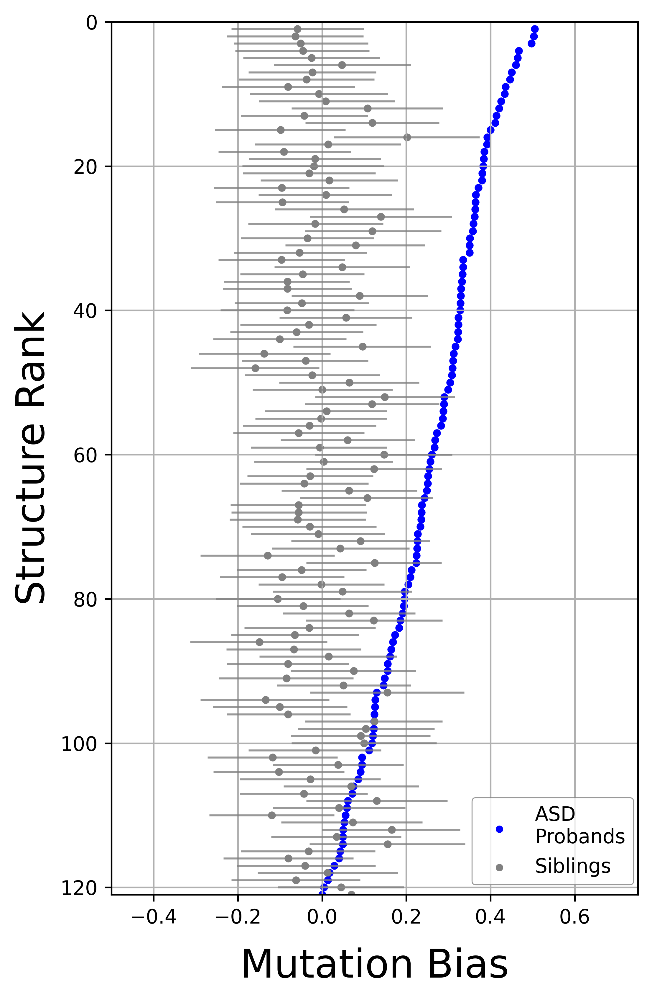

In [26]:
mpl.style.use('default')
fig, ax = plt.subplots(figsize=(6, 8), dpi=480)

"""
for i, (Rank, data) in enumerate(Sib_Sim_Bias_STR.items()):
    upper, lower = CI(data, 0.95)
    ax.hlines(i+1.2 , lower, upper, color = "orange", lw=1)
    x3 = ax.scatter(np.mean(data), i+1, marker=".", s=15, color="orange")
for i, (STR, STR_bias) in enumerate(sorted(Sib_Z2_Bias.items(), key=lambda x:x[1].Rank)):
    x1 = ax.scatter(STR_bias.Bias, i+1, marker="^", s=15, color="darkorange")
"""

#for i, (Rank, data) in enumerate(ASD_Z2_Sim_Bias_STR.items()):
    #upper, lower = CI(data, 0.95)
#    upper, lower = CI(data, 0.68) # 1sd
#    ax.hlines(i+1 , lower, upper, color = "grey", lw=1, alpha=0.8)
#    x4 = ax.scatter(np.mean(data), i+1, marker=".", s=15, color="grey")
for i, (STR, STR_bias) in enumerate(sorted(ASD_Z2_Bias.items(), key=lambda x:x[1].Rank)):
    x2 = ax.scatter(STR_bias.Bias, i+1, marker=".", s=35, color="blue")
    data = ASD_Z2_Sim_Bias_STR[STR]
    upper, lower = CI(data, 0.68) # 1sd
    ax.hlines(i+1 , lower, upper, color = "grey", lw=1, alpha=0.8)
    x4 = ax.scatter(np.mean(data), i+1, marker=".", s=35, color="grey")
    
#plt.gca().invert_yaxis()
#lgnd = ax.legend([x2, x4, x1, x3], 
#                 ["Proband Bias", "Sim Proband Bias", "Sibling Bias", "Sim Sibling Bias"], 
#                 prop={'size': 12}, loc="lower right")

plt.gca().invert_yaxis()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgnd = ax.legend([x2, x4,], 
                 ["ASD\nProbands", "Siblings", ], 
                 prop={'size': 10}, loc="lower right", bbox_to_anchor=(1.01, 0))
lgnd.get_frame().set_edgecolor('grey')
lgnd.get_frame().set_linewidth(0.5)


#ax.legend(loc="center left", bbox_to_anchor=(1, 0.9))

lgnd.legendHandles[0]._sizes = [30]
#lgnd.legendHandles[1]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]
#lgnd.legendHandles[3]._sizes = [30]

plt.ylim(121, 0)
plt.xlim(-0.5, 0.75)

plt.xlabel("Mutation Bias", fontsize=20, labelpad=10)
plt.ylabel("Structure Rank", fontsize=20)
#labelpad=10

plt.grid(True)
plt.savefig("../figs_v2/Figure2A.pdf")

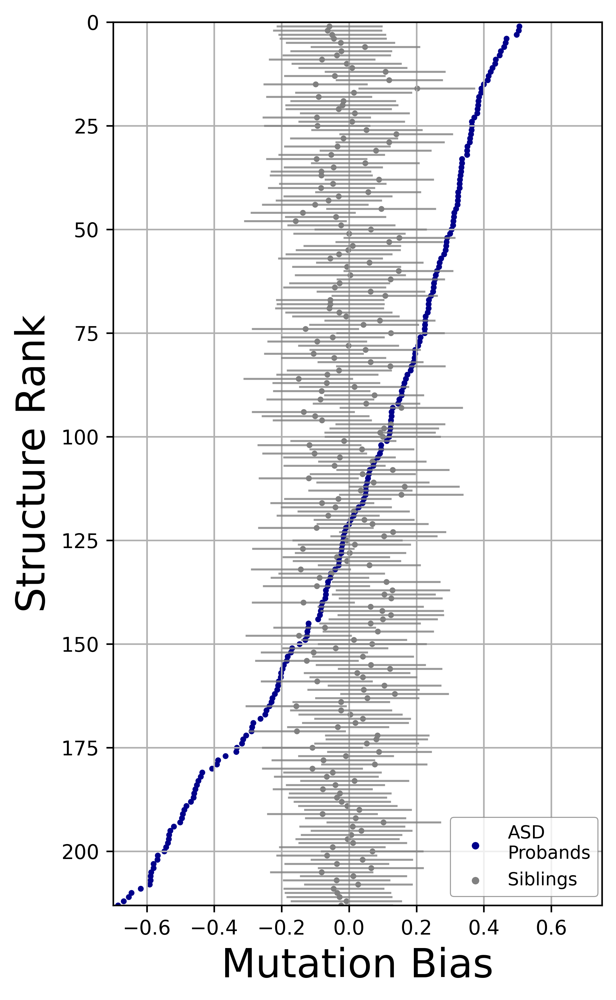

In [23]:
mpl.style.use('default')
fig, ax = plt.subplots(figsize=(5.5, 8), dpi=480)

for i, (STR, STR_bias) in enumerate(sorted(ASD_Z2_Bias.items(), key=lambda x:x[1].Rank)):
    x2 = ax.scatter(STR_bias.Bias, i+1, marker=".", s=15, color="darkblue")
    data = ASD_Z2_Sim_Bias_STR[STR]
    upper, lower = CI(data, 0.68) # 1sd
    ax.hlines(i+1 , lower, upper, color = "grey", lw=1, alpha=0.8)
    x4 = ax.scatter(np.mean(data), i+1, marker=".", s=15, color="grey")

plt.gca().invert_yaxis()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgnd = ax.legend([x2, x4,], 
                 ["ASD\nProbands", "Siblings", ], 
                 prop={'size': 9}, loc="lower right", bbox_to_anchor=(1.01, 0))
lgnd.get_frame().set_edgecolor('grey')
lgnd.get_frame().set_linewidth(0.5)


#ax.legend(loc="center left", bbox_to_anchor=(1, 0.9))

lgnd.legendHandles[0]._sizes = [30]
#lgnd.legendHandles[1]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]
#lgnd.legendHandles[3]._sizes = [30]

plt.xlim(-0.7, 0.75)
plt.ylim(213, 0) 
plt.xlabel("Mutation Bias", fontsize=20)
plt.ylabel("Structure Rank", fontsize=20)

plt.grid(True)
#plt.savefig("../figs_v2/Figure2A.pdf")

In [8]:
SIB_Bias = pd.read_csv("../dat/Unionize_bias/sib.top61.Z2.csv", 
                          index_col="STR")
SIB_Z2_Bias, SIB_Z2_Match_Bias_Rank, SIB_Z2_Sim_Bias_STR = LoadBiasData2(
    SIB_Bias, ASD_Sim_dir)

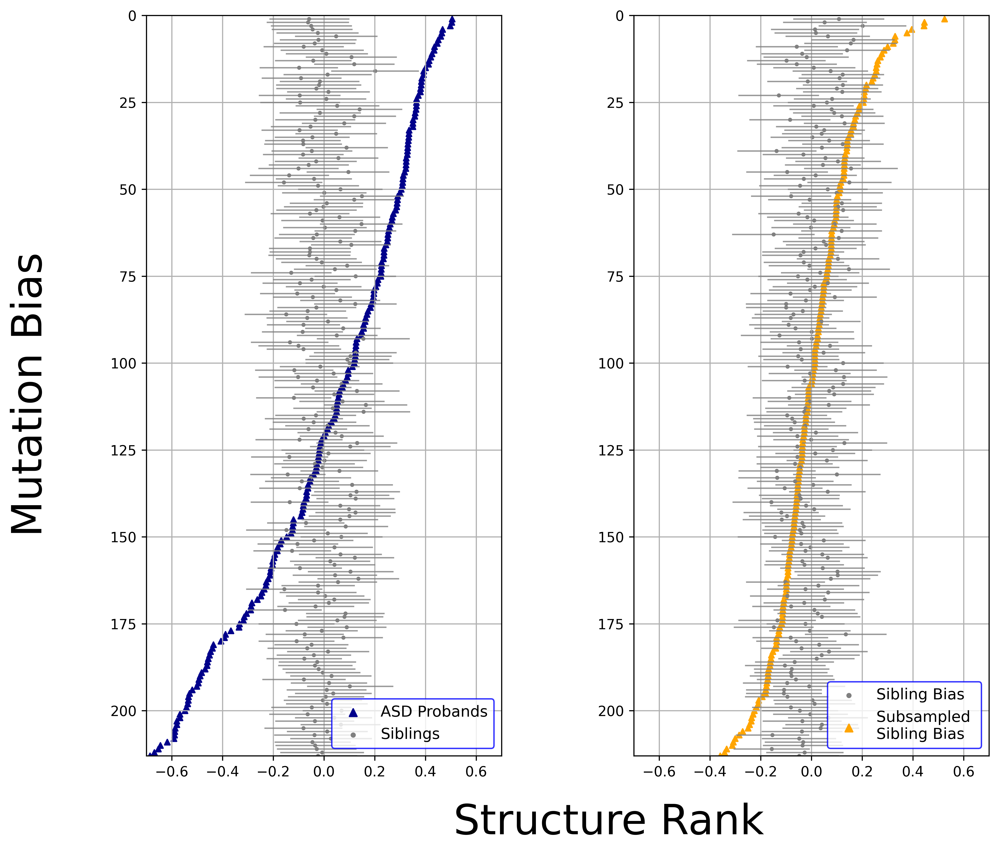

In [9]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 8), dpi=480)

# ASD
for i, (STR, STR_bias) in enumerate(sorted(ASD_Z2_Bias.items(), key=lambda x:x[1].Rank)):
    x2 = ax1.scatter(STR_bias.Bias, i+1, marker="^", s=15, color="darkblue")
    data = ASD_Z2_Sim_Bias_STR[STR]
    upper, lower = CI(data, 0.68) # 1sd
    ax1.hlines(i+1 , lower, upper, color = "grey", lw=1, alpha=0.8)
    x4 = ax1.scatter(np.mean(data), i+1, marker=".", s=15, color="grey")


plt.gca().invert_yaxis()
box = ax1.get_position()
ax1.set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgnd = ax1.legend([x2, x4], 
                 ["ASD Probands", "Siblings", ], 
                 prop={'size': 11}, loc="lower right", bbox_to_anchor=(1.0, 0))
lgnd.get_frame().set_edgecolor('b')
lgnd.get_frame().set_linewidth(1.0)

lgnd.legendHandles[0]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]

ax1.set_ylim(213, 0)
ax1.set_xlim(-0.7, 0.7)
plt.grid(True)

for i, (STR, STR_bias) in enumerate(sorted(SIB_Z2_Bias.items(), key=lambda x:x[1].Rank)):
    x2 = ax2.scatter(STR_bias.Bias, i+1, marker="^", s=15, color="orange")
    data = SIB_Z2_Sim_Bias_STR[STR]
    upper, lower = CI(data, 0.68) # 1sd
    ax2.hlines(i+1 , lower, upper, color = "grey", lw=1, alpha=0.8)
    x1 = ax2.scatter(np.mean(data), i+1, marker=".", s=15, color="grey")


plt.gca().invert_yaxis()
box = ax2.get_position()
ax2.set_position([box.x0, box.y0, box.width * 0.8, box.height])
lgnd = ax2.legend([x1, x2], 
                 ["Sibling Bias", "Subsampled \nSibling Bias", ], 
                 prop={'size': 11}, loc="lower right", bbox_to_anchor=(1.0, 0))
lgnd.get_frame().set_edgecolor('b')
lgnd.get_frame().set_linewidth(1.0)

lgnd.legendHandles[0]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]
ax2.set_ylim(213, 0)
ax2.set_xlim(-0.7, 0.7)


#ax.text(-0.1, 1.15, label, transform=ax.transAxes,
#  fontsize=16, fontweight='bold', va='top', ha='right')
#ax.text(-0.1, 1.15, label, transform=ax.transAxes,
#  fontsize=16, fontweight='bold', va='top', ha='right')

fig.text(0.6, -0.05, 'Structure Rank', ha='center', fontsize=30)
fig.text(0, 0.5, 'Mutation Bias', va='center', rotation='vertical', fontsize=30)


fig.subplots_adjust(wspace=14)
ax1.grid(True)
ax2.grid(True)
plt.tight_layout()
#plt.savefig("../figs/Figure2A.pdf")

###### Test Average abs Z

In [14]:
#ASD
asd_mean_abs_bias = np.mean([abs(x) for x in ASD_Bias["EFFECT"].values])
sib_mean_abs_bias = np.mean([abs(x) for x in SIB_Bias["EFFECT"].values])

subsib_mean_abs_biases = []
for file in os.listdir(ASD_Sim_dir):
    if file.startswith("cont.genes"):
        continue
    df = pd.read_csv(ASD_Sim_dir+file, index_col="STR")
    mean_abs_bias = np.mean([abs(x) for x in df["EFFECT"].values])
    subsib_mean_abs_biases.append(mean_abs_bias)

In [15]:
print(GetPermutationP(subsib_mean_abs_biases, asd_mean_abs_bias))
print(GetPermutationP(subsib_mean_abs_biases, sib_mean_abs_bias))

(5.933572390174255, 9.999000099991662e-05)
(-0.919300561160039, 0.8247175282471753)


In [16]:
np.mean(subsib_mean_abs_biases)

0.14227786664278172

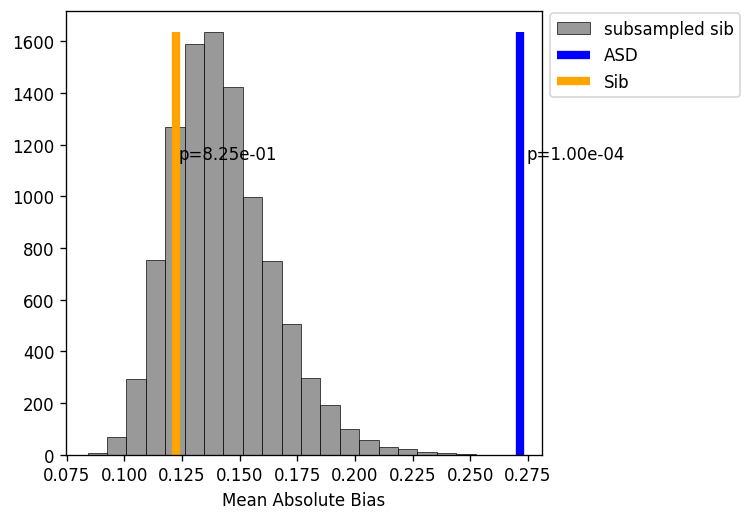

In [17]:
import matplotlib.style
import matplotlib as mpl
mpl.style.use('default')
fig, ax = plt.subplots(dpi=120)
n, bins, patches = ax.hist(subsib_mean_abs_biases, bins=20, histtype = "barstacked", align="mid", 
                          facecolor="grey", alpha=0.8, label="subsampled sib", edgecolor="black", 
                          linewidth=0.5)
Z1, P1 = GetPermutationP(subsib_mean_abs_biases, asd_mean_abs_bias)
Z2, P2 = GetPermutationP(subsib_mean_abs_biases, sib_mean_abs_bias)
ax.vlines(asd_mean_abs_bias, ymin=0, ymax = max(n), linewidth = 5, color="blue", label="ASD")
ax.vlines(sib_mean_abs_bias, ymin=0, ymax = max(n), linewidth = 5, color="orange", label="Sib")
ax.text(x=asd_mean_abs_bias*1.01, y=max(n)*0.7, s = "p=%.2e"%P1)
ax.text(x=sib_mean_abs_bias*1.01, y=max(n)*0.7, s = "p=%.2e"%P2)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(1, 0.9))
ax.set_xlabel("Mean Absolute Bias")
plt.show()

In [18]:
def cut_posotive(BiasDF):
    last_eff = 1
    for str_, row in BiasDF.iterrows():
        eff = row["EFFECT"]
        if eff <=0 and last_eff > 0:
            return row["Rank"]
        last_eff = eff
def GetMeanLogP_Positive(BiasDF):
    cut_size = cut_posotive(BiasDF)
    return np.mean(BiasDF[BiasDF["Rank"]<=cut_size]["EFFECT"].values)

In [19]:
asd_mean_abs_bias = GetMeanLogP_Positive(ASD_Bias)
sib_mean_abs_bias = GetMeanLogP_Positive(SIB_Bias)

subsib_mean_abs_biases = []
for file in os.listdir(ASD_Sim_dir):
    if file.startswith("cont.genes"):
        continue
    df = pd.read_csv(ASD_Sim_dir+file, index_col="STR")
    mean_abs_bias = GetMeanLogP_Positive(df)
    subsib_mean_abs_biases.append(mean_abs_bias)

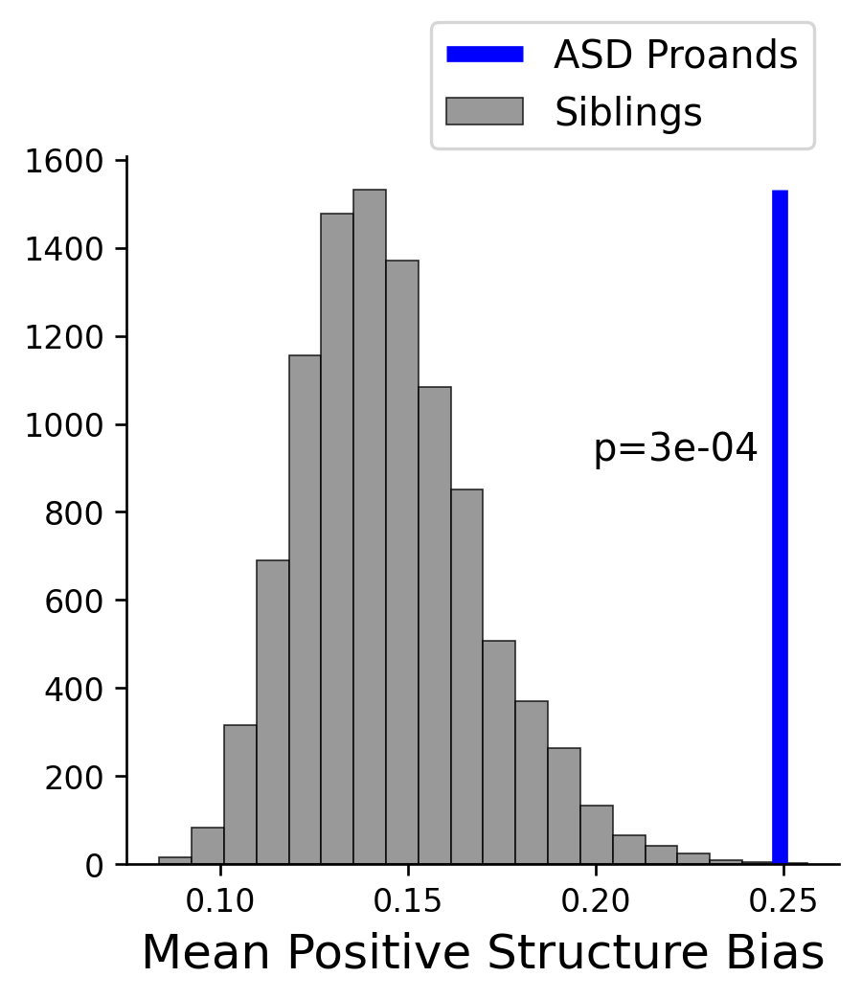

In [79]:
import matplotlib.style
import matplotlib as mpl
mpl.style.use('default')
fig, ax = plt.subplots(dpi=240, figsize=(5,4))
ax.vlines(asd_mean_abs_bias, ymin=0, ymax = max(n), linewidth = 5, color="blue", label="ASD Probands")
n, bins, patches = ax.hist(subsib_mean_abs_biases, bins=20, histtype = "barstacked", align="mid", 
                          facecolor="grey", alpha=0.8, label="Siblings", edgecolor="black", 
                          linewidth=0.5)
Z1, P1 = GetPermutationP(subsib_mean_abs_biases, asd_mean_abs_bias)
Z2, P2 = GetPermutationP(subsib_mean_abs_biases, sib_mean_abs_bias)

#ax.vlines(sib_mean_abs_bias, ymin=0, ymax = max(n), linewidth = 5, color="orange", label="Siblings")
ax.text(x=asd_mean_abs_bias*.80, y=max(n)*0.6, s = "p=%.e"%P1, fontsize=12)
#ax.text(x=sib_mean_abs_bias*1.05, y=max(n)*0.6, s = "p=%.e"%P2, fontsize=15)
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc="center left", bbox_to_anchor=(0.4, 1.1), fontsize=12)
ax.set_xlabel("Mean Positive Structure Bias", fontsize=15)
ax.spines[['right', 'top']].set_visible(False)
plt.show()

#### Figure 3

In [107]:
topNs = np.arange(200, 5, -1)
DIR = "/home/jw3514/Work/ASD_Circuits/scripts/RankScores"
ASD_Distance = np.load("{}/RankScore.Ipsi.ASD.npy".format(DIR))
Cont_Distance = np.load("{}/RankScore.Ipsi.Cont.npy".format(DIR))

ASD_DistanceShort = np.load("{}/RankScore.Ipsi.Short.3900.ASD.npy".format(DIR))
Cont_DistanceShort = np.load("{}/RankScore.Ipsi.Short.3900.Cont.npy".format(DIR))

ASD_DistanceLong = np.load("{}/RankScore.Ipsi.Long.3900.ASD.npy".format(DIR))
Cont_DistanceLong = np.load("{}/RankScore.Ipsi.Long.3900.Cont.npy".format(DIR))

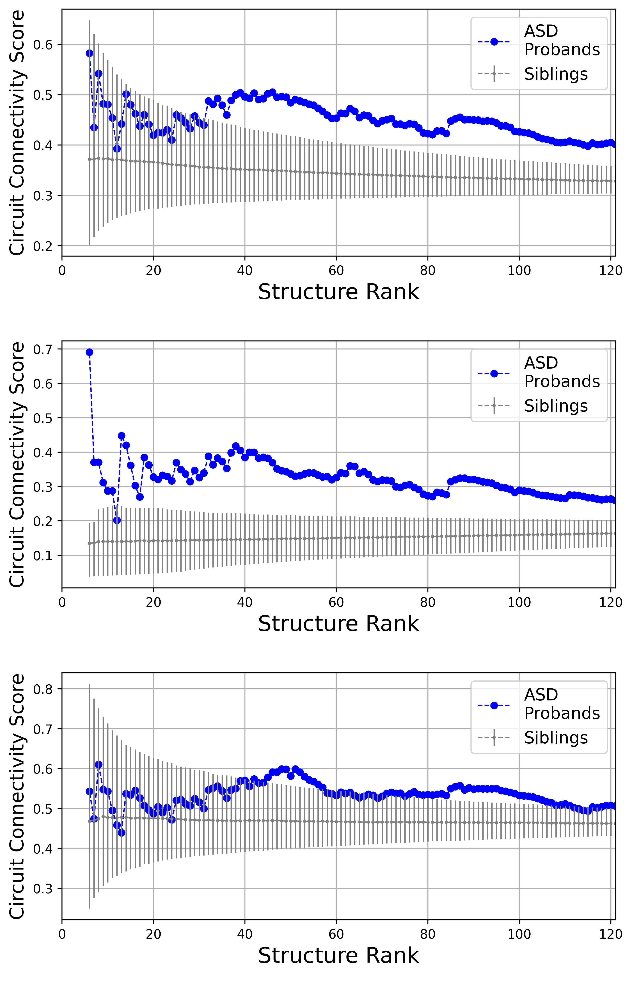

In [108]:
import matplotlib.backends.backend_pdf

fig, (ax1, ax2, ax3) = plt.subplots(3,1, dpi=480, figsize=(7,11))

BarLen = 34.1
#BarLen = 47.5

cont = np.median(Cont_Distance, axis=0)
ax1.plot(topNs, ASD_Distance, color="blue", marker="o", markersize=5, lw=1,
                     ls="dashed", label="ASD\nProbands")

lower = np.percentile(Cont_Distance, 50-BarLen, axis=0)
upper = np.percentile(Cont_Distance, 50+BarLen, axis=0)
ax1.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="Siblings")
ax1.set_xlabel("Structure Rank\n", fontsize=17)
ax1.set_ylabel("Circuit Connectivity Score", fontsize=15)
ax1.legend(fontsize=13)

cont = np.nanmean(Cont_DistanceLong, axis=0)
ax2.plot(topNs, ASD_DistanceLong, color="blue", marker="o", markersize=5, lw=1,
                     ls="dashed", label="ASD\nProbands")

lower = np.nanpercentile(Cont_DistanceLong, 50-BarLen, axis=0)
upper = np.nanpercentile(Cont_DistanceLong, 50+BarLen, axis=0)
ax2.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, abs(upper - cont) ), ls="dashed", label="Siblings")
ax2.set_xlabel("Structure Rank\n", fontsize=17)
ax2.set_ylabel("Circuit Connectivity Score", fontsize=15)
ax2.legend(fontsize=13)

cont = np.median(Cont_DistanceShort, axis=0)
ax3.plot(topNs, ASD_DistanceShort, color="blue", marker="o", markersize=5, lw=1,
                     ls="dashed", label="ASD\nProbands")

lower = np.percentile(Cont_DistanceShort, 50-BarLen, axis=0)
upper = np.percentile(Cont_DistanceShort, 50+BarLen, axis=0)
ax3.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="Siblings")
ax3.set_xlabel("Structure Rank\n", fontsize=17)
ax3.set_ylabel("Circuit Connectivity Score", fontsize=15)
ax3.legend(fontsize=13)

#fig.text(0.5, -0.03, 'Top Number of Structuress', ha='center')
#fig.text(-0.03, 0.5, 'SI Score', va='center', rotation='vertical')
ax1.set_xlim(0, 121)
ax2.set_xlim(0, 121)
ax3.set_xlim(0, 121)
plt.tight_layout()
#plt.legend(fontsize=15)
ax1.grid(True)
ax2.grid(True)
ax3.grid(True)
plt.savefig("../figs/main/Fig2.BCD.pdf")
plt.savefig("../figs/main/Fig2.BCD.png")

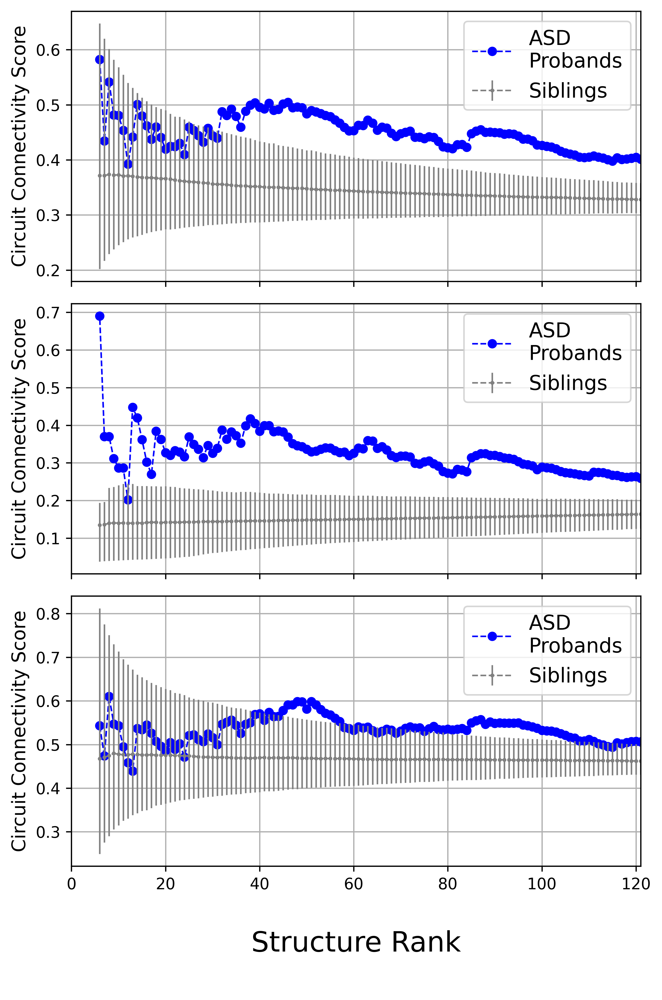

In [109]:
import matplotlib.backends.backend_pdf

fig, (ax1, ax2, ax3) = plt.subplots(3,1, dpi=480, figsize=(6,9))

BarLen = 34.1
#BarLen = 47.5

cont = np.median(Cont_Distance, axis=0)
ax1.plot(topNs, ASD_Distance, color="blue", marker="o", markersize=5, lw=1,
                     ls="dashed", label="ASD\nProbands")

lower = np.percentile(Cont_Distance, 50-BarLen, axis=0)
upper = np.percentile(Cont_Distance, 50+BarLen, axis=0)
ax1.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="Siblings")
#ax1.set_xlabel("Structure Rank\n", fontsize=17)
ax1.set_ylabel("Circuit Connectivity Score", fontsize=12)
ax1.set_xticklabels(labels=[])
ax1.legend(fontsize=13)
#plt.yticks(fontsize=15, rotation=0)
cont = np.nanmean(Cont_DistanceLong, axis=0)
ax2.plot(topNs, ASD_DistanceLong, color="blue", marker="o", markersize=5, lw=1,
                     ls="dashed", label="ASD\nProbands")

lower = np.nanpercentile(Cont_DistanceLong, 50-BarLen, axis=0)
upper = np.nanpercentile(Cont_DistanceLong, 50+BarLen, axis=0)
ax2.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, abs(upper - cont) ), ls="dashed", label="Siblings")
#ax2.set_xlabel("Structure Rank\n", fontsize=17)
ax2.set_xticklabels(labels=[])
ax2.set_ylabel("Circuit Connectivity Score", fontsize=12)
ax2.legend(fontsize=13)
#plt.yticks(fontsize=15, rotation=0)
cont = np.median(Cont_DistanceShort, axis=0)
ax3.plot(topNs, ASD_DistanceShort, color="blue", marker="o", markersize=5, lw=1,
                     ls="dashed", label="ASD\nProbands")

lower = np.percentile(Cont_DistanceShort, 50-BarLen, axis=0)
upper = np.percentile(Cont_DistanceShort, 50+BarLen, axis=0)
ax3.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="Siblings")
ax3.set_xlabel("\nStructure Rank\n", fontsize=18)
ax3.set_ylabel("Circuit Connectivity Score", fontsize=12)
ax3.tick_params(axis='both', which='minor', labelsize=12)
ax3.legend(fontsize=13)

#fig.text(0.5, -0.03, 'Top Number of Structuress', ha='center')
#fig.text(-0.03, 0.5, 'SI Score', va='center', rotation='vertical')
ax1.set_xlim(0, 121)
ax2.set_xlim(0, 121)
ax3.set_xlim(0, 121)
plt.tight_layout()
#plt.legend(fontsize=15)
ax1.grid(True)
ax2.grid(True)
ax3.grid(True)
#plt.xticks(fontsize=15, rotation=0)
#plt.yticks(fontsize=15, rotation=0)
plt.savefig("../figs/main/Fig2.BCD.pdf")
plt.savefig("../figs/main/Fig2.BCD.png")

<AxesSubplot: title={'center': 'Info Per Edge Inside Circuit'}, xlabel='Normed Score'>

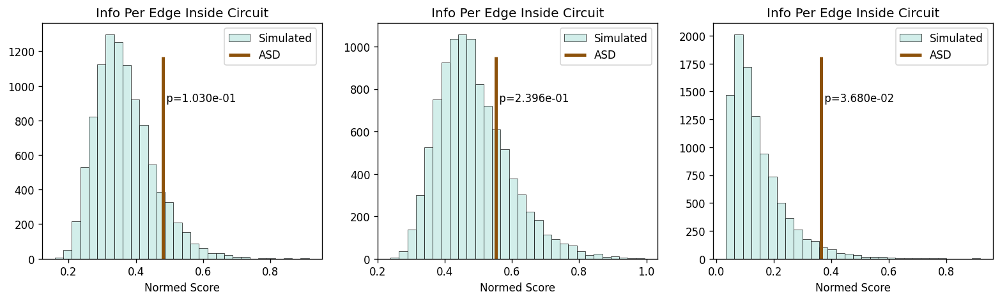

In [111]:
size = 33
idx = np.where(topNs==size)[0][0]
fig, (ax1, ax2, ax3) = plt.subplots(1,3,dpi=120, figsize=(16,4))
PlotPermutationP(Cont_Distance[:, idx], (ASD_Distance)[idx], ax1,
                     title="Info Per Edge Inside Circuit".format(), xlabel="Normed Score", 
                     dist_label="Simulated", bar_label="ASD")
PlotPermutationP(Cont_DistanceShort[:, idx], (ASD_DistanceShort)[idx], ax2,
                     title="Info Per Edge Inside Circuit".format(), xlabel="Normed Score", 
                     dist_label="Simulated", bar_label="ASD")
PlotPermutationP(Cont_DistanceLong[:, idx], (ASD_DistanceLong)[idx], ax3,
                     title="Info Per Edge Inside Circuit".format(), xlabel="Normed Score", 
                     dist_label="Simulated", bar_label="ASD")

In [24]:
# For Sibling
ScoreMatDir="/home/jw3514/Work/ASD_Circuits/dat/allen-mouse-conn/ScoreingMat_jw_v3/"
IpsiInfoMat=pd.read_csv(ScoreMatDir + "InfoMat.Ipsi.csv", index_col=0)
IpsiInfoMatShort_v1=pd.read_csv(ScoreMatDir + "InfoMat.Ipsi.Short.2600.csv", index_col=0)
IpsiInfoMatLong_v1=pd.read_csv(ScoreMatDir + "InfoMat.Ipsi.Long.2600.csv", index_col=0)
STR_Ranks = SIB_Bias.index.values
#STR_Ranks = ASD_Bias.index.values
topNs = list(range(200, 5, -1))
sib_topN_score = []
sib_topN_scoreShort = []
sib_topN_scoreLong = []
for topN in topNs:
    top_strs = STR_Ranks[:topN]
    score = ScoreCircuit_SI_Joint(top_strs, IpsiInfoMat)
    scoreShort = ScoreCircuit_SI_Joint(top_strs, IpsiInfoMatShort_v1)
    scoreLong = ScoreCircuit_SI_Joint(top_strs, IpsiInfoMatLong_v1)
    sib_topN_score.append(score)
    sib_topN_scoreShort.append(scoreShort)
    sib_topN_scoreLong.append(scoreLong)
sib_topN_score = np.array(sib_topN_score)
sib_topN_scoreShort = np.array(sib_topN_scoreShort)
sib_topN_scoreLong = np.array(sib_topN_scoreLong)

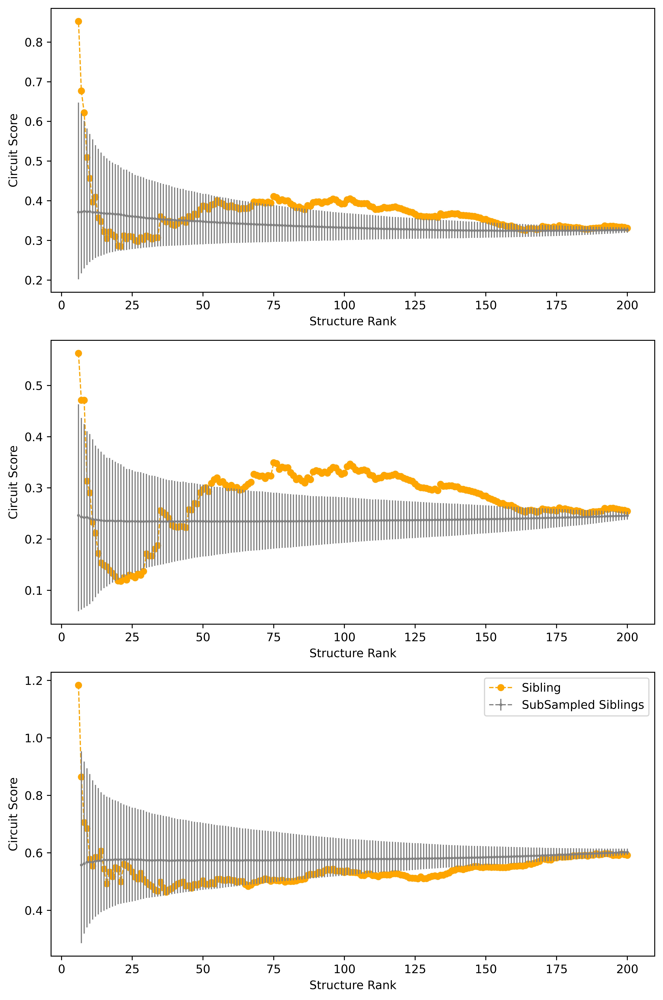

In [25]:
import matplotlib.backends.backend_pdf

BarLen = 34.1
#BarLen = 47.5

fig, (ax1, ax2, ax3) = plt.subplots(3,1, dpi=720, figsize=(8,12))

cont = np.median(Cont_Distance, axis=0)
ax1.plot(topNs, sib_topN_score, color="orange", marker="o", markersize=5, lw=1,
                     ls="dashed", label="Sibling")
lower = np.percentile(Cont_Distance, 50-BarLen, axis=0)
upper = np.percentile(Cont_Distance, 50+BarLen, axis=0)
ax1.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="SubSampled Siblings")
ax1.set_xlabel("Structure Rank")
ax1.set_ylabel("Circuit Score")

cont = np.nanmean(Cont_DistanceLong, axis=0)
ax2.plot(topNs, sib_topN_scoreLong, color="orange", marker="o", markersize=5, lw=1,
                     ls="dashed", label="Sibling")
lower = np.nanpercentile(Cont_DistanceLong, 50-BarLen, axis=0)
upper = np.nanpercentile(Cont_DistanceLong, 50+BarLen, axis=0)
ax2.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, abs(upper - cont) ), ls="dashed", label="SubSampled Siblings")
ax2.set_xlabel("Structure Rank")
ax2.set_ylabel("Circuit Score")

cont = np.median(Cont_DistanceShort, axis=0)
ax3.plot(topNs, sib_topN_scoreShort, color="orange", marker="o", markersize=5, lw=1,
                     ls="dashed", label="Sibling")
lower = np.percentile(Cont_DistanceShort, 50-BarLen, axis=0)
upper = np.percentile(Cont_DistanceShort, 50+BarLen, axis=0)
ax3.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="SubSampled Siblings")
ax3.set_xlabel("Structure Rank")
ax3.set_ylabel("Circuit Score")

#fig.text(0.5, -0.03, 'Structure Ranks', ha='center')
#fig.text(-0.03, 0.5, 'SI Score', va='center', rotation='vertical')
plt.tight_layout()
plt.legend()

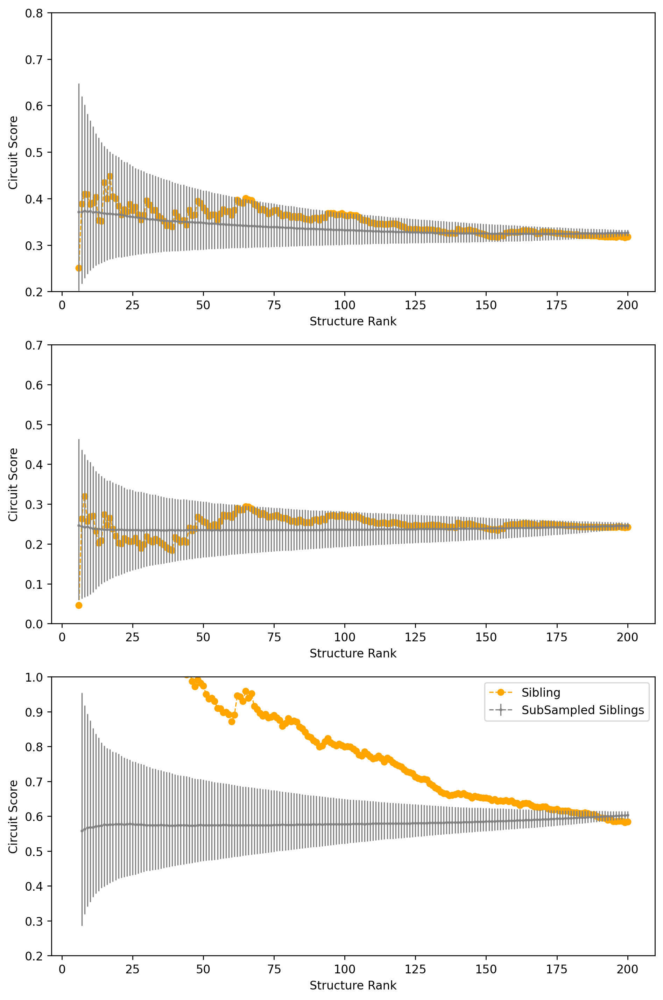

In [22]:
idx=20

fig, (ax1, ax2, ax3) = plt.subplots(3,1, dpi=240, figsize=(8,12))

cont = np.median(Cont_Distance, axis=0)
ax1.plot(topNs, Cont_Distance[idx, :], color="orange", marker="o", markersize=5, lw=1,
                     ls="dashed", label="Sibling")
lower = np.percentile(Cont_Distance, 50-34.1, axis=0)
upper = np.percentile(Cont_Distance, 50+34.1, axis=0)
ax1.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="SubSampled Siblings")
ax1.set_xlabel("Structure Rank")
ax1.set_ylabel("Circuit Score")
ax1.set_ylim(0.2, 0.8)

cont = np.nanmean(Cont_DistanceLong, axis=0)
ax2.plot(topNs, Cont_DistanceLong[idx, :], color="orange", marker="o", markersize=5, lw=1,
                     ls="dashed", label="Sibling")
lower = np.nanpercentile(Cont_DistanceLong, 50-34.1, axis=0)
upper = np.nanpercentile(Cont_DistanceLong, 50+34.1, axis=0)
ax2.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, abs(upper - cont) ), ls="dashed", label="SubSampled Siblings")
ax2.set_xlabel("Structure Rank")
ax2.set_ylabel("Circuit Score")
ax2.set_ylim(0.0, 0.7)

cont = np.median(Cont_DistanceShort, axis=0)
ax3.plot(topNs, Cont_DistanceShort[idx,:], color="orange", marker="o", markersize=5, lw=1,
                     ls="dashed", label="Sibling")
lower = np.percentile(Cont_DistanceShort, 50-34.1, axis=0)
upper = np.percentile(Cont_DistanceShort, 50+34.1, axis=0)
ax3.errorbar(topNs, cont, color="grey", marker="o", markersize=1.5, lw=1,
            yerr=(cont - lower, upper - cont ), ls="dashed", label="SubSampled Siblings")
ax3.set_xlabel("Structure Rank")
ax3.set_ylabel("Circuit Score")
ax3.set_ylim(0.2, 1.0)
#fig.text(0.5, -0.03, 'Structure Ranks', ha='center')
#fig.text(-0.03, 0.5, 'SI Score', va='center', rotation='vertical')

plt.tight_layout()
plt.legend()

#### Figure 5 

##### Fig5 A 

In [247]:
def MaskDistMat(Mat1, Mat2, cutoff, m='lt'):
    New_Mat2 = Mat2.copy(deep=True)
    for STR_i in Mat1.index.values:
        for STR_j in Mat1.columns.values:
            if m == 'gt':
                if Mat1.loc[STR_i, STR_j] >= cutoff:
                    New_Mat2.loc[STR_i, STR_j] = 0
                else:
                    New_Mat2.loc[STR_i, STR_j] = Mat2.loc[STR_i, STR_j]
            elif m == "lt":
                if Mat1.loc[STR_i, STR_j] <= cutoff:
                    New_Mat2.loc[STR_i, STR_j] = 0
                else:
                    New_Mat2.loc[STR_i, STR_j] = Mat2.loc[STR_i, STR_j]
    return New_Mat2

def MaskDistMat_xx(distance_mat, Conn_mat, cutoff, cutoff2, keep='gt'):
    Conn_mat_new = Conn_mat.copy(deep=True)
    distance_mat_new = distance_mat.copy(deep=True)
    for STR_i in distance_mat.index.values:
        for STR_j in distance_mat.columns.values:
            if keep == 'gt':
                if distance_mat.loc[STR_i, STR_j] >= cutoff:
                    Conn_mat_new.loc[STR_i, STR_j] = Conn_mat.loc[STR_i, STR_j]
                    distance_mat_new.loc[STR_i, STR_j] = distance_mat.loc[STR_i, STR_j]
                else:
                    Conn_mat_new.loc[STR_i, STR_j] = 0
                    distance_mat_new.loc[STR_i, STR_j] = 0
            elif keep == "lt":
                if distance_mat.loc[STR_i, STR_j] <= cutoff:
                    Conn_mat_new.loc[STR_i, STR_j] = Conn_mat.loc[STR_i, STR_j]
                    distance_mat_new.loc[STR_i, STR_j] = distance_mat.loc[STR_i, STR_j]
                else:
                    Conn_mat_new.loc[STR_i, STR_j] = 0
                    distance_mat_new.loc[STR_i, STR_j] = 0   
            elif keep=="bw":
                if distance_mat.loc[STR_i, STR_j] >= cutoff and distance_mat.loc[STR_i, STR_j] <= cutoff2:
                    Conn_mat_new.loc[STR_i, STR_j] = Conn_mat.loc[STR_i, STR_j]
                    distance_mat_new.loc[STR_i, STR_j] = distance_mat.loc[STR_i, STR_j]
                else:
                    Conn_mat_new.loc[STR_i, STR_j] = 0
                    distance_mat_new.loc[STR_i, STR_j] = 0   
    return Conn_mat_new, distance_mat_new

In [39]:
# Circuit STR data
ASD_CircuitsSet = pd.read_csv(
    "/home/jw3514/Work/ASD_Circuits/notebooks/ASD.SA.Circuits.Size46.csv",
    index_col="idx")
ASD_Circuits = ASD_CircuitsSet.loc[3, "STRs"].split(";")
RealSibSTRs = pd.read_csv("../dat/Unionize_bias/sib.top61.Z2.csv", 
                          index_col="STR").head(46).index.values

In [28]:
print(RegionDistributionsList(ASD_Circuits))

Hippocampus	6	Dentate_gyrus; Field_CA2; Subiculum_ventral_part; Field_CA1; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Thalamus	8	Parafascicular_nucleus; Nucleus_of_reuniens; Lateral_posterior_nucleus_of_the_thalamus; Rhomboid_nucleus; Submedial_nucleus_of_the_thalamus; Parataenial_nucleus; Mediodorsal_nucleus_of_thalamus; Anteromedial_nucleus_dorsal_part
Amygdalar	3	Lateral_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Basolateral_amygdalar_nucleus
Midbrain	1	Anterior_pretectal_nucleus
Striatum	3	Nucleus_accumbens; Caudoputamen; Lateral_septal_nucleus_rostral_rostroventral_part
Cortical_subplate	2	Claustrum; Endopiriform_nucleus_dorsal_part
Olfactory_areas	3	Anterior_olfactory_nucleus; Dorsal_peduncular_area; Piriform_area
Isocortex	19	Orbital_area_lateral_part; Prelimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Infralimbic_area; Anteromedial_visual_area; Retrosplenial_area_lateral_agranular_part; Primary_visual_area; Primary_motor_area;

In [35]:
Cartesian_distances_w_edge = MaskDistMat(adj_mat, Cartesian_distancesDF, cutoff=0)
Distance_Cuts = [0, 1000, 2000, 3000, 4000, 5000, 100000]
Dist_cut_graphs = []

N_Connections_total = []
for i, cut in enumerate(Distance_Cuts[:-1]):
    Conn_mat_new, distance_mat_new = MaskDistMat_xx(Cartesian_distances_w_edge, adj_mat, keep="bw",
                                                cutoff=Distance_Cuts[i], cutoff2=Distance_Cuts[i+1])
    N_Connections_total.append(np.count_nonzero(Conn_mat_new))
    g_ = LoadConnectome2(Conn_mat_new)
    Dist_cut_graphs.append(g_)

In [41]:
ASD_top_conn, Sib_top_conn = [], []
N_Connections_total = []
for i,v in enumerate(Dist_cut_graphs):
    g_ = Dist_cut_graphs[i]
    N_Connections_total.append(len(g_.es))
    cohe, Nconn = ScoreSTRSet(g_, ASD_Circuits)
    ASD_top_conn.append(Nconn)
    cohe, Nconn = ScoreSTRSet(g_, RealSibSTRs)
    Sib_top_conn.append(Nconn)
ASD_top_conn = np.array(ASD_top_conn)
Sib_top_conn = np.array(Sib_top_conn)
N_Connections_total = np.array(N_Connections_total)

asd_conn_density = ASD_top_conn/N_Connections_total
sib_conn_density = Sib_top_conn/N_Connections_total

In [43]:
def getratio_asd_sib(Dist_cut_graphs, ASD_STRs, Sib_STRs):
    ASD_top49_conn, Sib_top49_conn = [], []
    N_Connections_total = []
    for i,v in enumerate(Dist_cut_graphs):
        g_ = Dist_cut_graphs[i]
        N_Connections_total.append(len(g_.es))
        ASD_top49_conn.append(len(subgraph(g_, ASD_STRs).es))
        Sib_top49_conn.append(len(subgraph(g_, Sib_STRs).es))
    ASD_top49_conn = np.array(ASD_top49_conn)
    Sib_top49_conn = np.array(Sib_top49_conn)
    N_Connections_total = np.array(N_Connections_total)
    return ASD_top49_conn, Sib_top49_conn, N_Connections_total


ASD_STRs = ASD_Circuits
Sib_STRs = RealSibSTRs
Nboot = 1000
Dat_ASD_boots, Dat_Sib_boots = [], []
for i in range(Nboot):
    ASD_STR_boot = np.random.choice(ASD_STRs, replace=True, size=len(ASD_STRs))
    Sib_STR_boot = np.random.choice(Sib_STRs, replace=True, size=len(Sib_STRs))
    g2_asd = subgraph(graph, ASD_STR_boot)
    g2_sib = subgraph(graph, Sib_STR_boot)
    bl_asd = len(g2_asd.es)/np.count_nonzero(adj_mat)
    bl_sib = len(g2_sib.es)/np.count_nonzero(adj_mat)
    ASD_top_conn, Sib_top_conn, N_Connections_total = getratio_asd_sib(
        Dist_cut_graphs, ASD_STR_boot, Sib_STR_boot)
    dat_asd = ASD_top_conn/N_Connections_total
    dat_sib = Sib_top_conn/N_Connections_total
    Dat_ASD_boots.append(dat_asd)
    Dat_Sib_boots.append(dat_sib)

Dat_ASD_boots = np.array(Dat_ASD_boots)
Dat_Sib_boots = np.array(Dat_Sib_boots)

ASD_Dy, Sib_Dy = [], []
for i in range(6):
    boots = Dat_ASD_boots[:, i]
    ASD_Dy.append(np.std(boots))
    
    boots = Dat_Sib_boots[:, i]
    Sib_Dy.append(np.std(boots))

ASD_Dy = np.array(ASD_Dy)
ASD_Dy = ASD_Dy.transpose()

Sib_Dy = np.array(Sib_Dy)
Sib_Dy = Sib_Dy.transpose()

In [44]:
## Random STRs
All_STRs = Cartesian_distancesDF.index.values
Rand_STRs = np.random.choice(All_STRs, size=(30, 1000))
Rand_Data = []
for i in range(1000):
    STRs = Rand_STRs[:, i]
    #print(STRs.shape)
    rand_top50_conn = []
    N_Connections_total = []
    for i,v in enumerate(Dist_cut_graphs):
        g_ = Dist_cut_graphs[i]
        N_Connections_total.append(len(g_.es))
        rand_top50_conn.append(len(subgraph(g_, STRs).es))
    rand_top50_conn = np.array(rand_top50_conn)
    N_Connections_total = np.array(N_Connections_total)
    
    dat_one_rand = rand_top50_conn/N_Connections_total
    Rand_Data.append(dat_one_rand)
Rand_Data = np.array(Rand_Data)

rand_mean = Rand_Data.mean(axis=0)
Rand_Dy = Rand_Data.std(axis=0)

In [ ]:
cont_dfs = []
for file in os.listdir(ASD_Sim_dir):
    if file.startswith("cont.genes"):
        continue
    df = pd.read_csv(ASD_Sim_dir+file, index_col="STR")
    cont_dfs.append(df)

/tmp/ipykernel_299694/1795728067.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')
/tmp/ipykernel_299694/1795728067.py:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-talk')
/tmp/ipykernel_299694/1795728067.py:10: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string ".k" (-> color='k'). The keyword argument will take precedence.
  ax1.errorbar(np.arange(6) + 0.05, sib_conn_density, yerr=Sib_Dy, fmt=".k",
/tmp/ipykernel_299694/17957

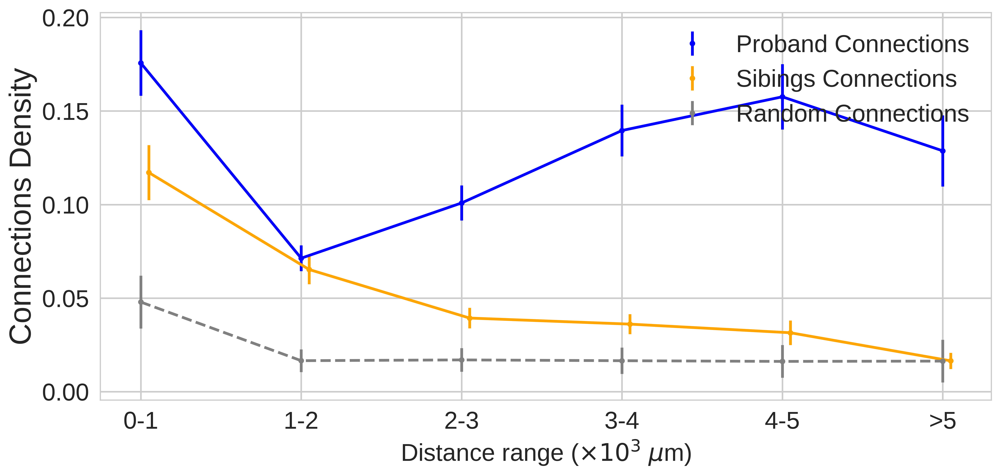

In [58]:
plt.style.use('seaborn-whitegrid')
%matplotlib inline
import matplotlib.ticker as mticker  
plt.style.use('seaborn-talk')
matplotlib.rcParams.update({'font.size': 25})
fig, ax1 = plt.subplots(dpi=480, figsize=(12,6))

ax1.errorbar(np.arange(6), asd_conn_density, yerr=ASD_Dy, fmt=".", 
             label="Proband Connections", color="blue")
ax1.errorbar(np.arange(6) + 0.05, sib_conn_density, yerr=Sib_Dy, fmt=".k", 
             label="Sibings Connections", color="orange")
ax1.errorbar(np.arange(6) , rand_mean, yerr=Rand_Dy, fmt=".k", 
             label="Random Connections", color="gray")
ax1.plot(np.arange(6), asd_conn_density, marker="." , color="blue")
ax1.plot(np.arange(6) + 0.05, sib_conn_density, marker=".", color="orange")
ax1.plot(np.arange(6)  , rand_mean, marker=".", color="gray", ls="dashed")


ax1.grid(True)
ax1.legend(loc="upper right", fontsize=20)
ax1.set_ylabel("Connections Density", fontsize=25)
ax1.set_xlabel(r"Distance range ($\times 10^3$ $\mu$m)", fontsize=20)
ax1.set_xticklabels(["", "0-1", "1-2", "2-3", "3-4", "4-5", r">5"], fontsize=20)
ax1.tick_params(axis='y', labelsize=20)
#plt.gca().xaxis.set_major_formatter(mticker.FormatStrFormatter('%s x1000'))
plt.tight_layout()
#fig.savefig("figs/n_Fig_4.A.pdf")

##### Fig5 B C

In [27]:
def CountMut(DF):
    N_LGD, N_mis, N_Dmis, N_syn = 0,0,0,0
    for i, row in DF.iterrows():
        GeneEff = row["GeneEff"].split(";")[0]
        if GeneEff in ["frameshift", "splice_acceptor", "splice_donor", "start_lost", "stop_gained", "stop_lost"]:
            N_LGD += 1
        elif GeneEff == "missense":
            N_mis += 1
            row["REVEL"] = row["REVEL"].split(";")[0]
            if row["REVEL"] != ".":
                if float(row["REVEL"]) > 0.5:
                    N_Dmis += 1
        elif GeneEff == "synonymous":
            N_syn += 1
    return N_LGD, N_mis, N_Dmis, N_syn
def Mut2GeneDF(MutDF):
    genes = np.array(list(set(MutDF["HGNC"].values)))
    dat = []
    gene2MutN = {}
    for g in genes:
        try:
            Entrez = int(GeneSymbol2Entrez[g])
        except:
            Entrez = -1
            continue
        Muts = MutDF[MutDF["HGNC"]==g]
        pLI = float(Muts["ExACpLI"].values[0])
        N_LGD, N_Mis, N_Dmis, N_Syn = CountMut(Muts)
        if pLI > 0.5:
            gene2MutN[Entrez] = N_LGD * 0.554 + N_Dmis * 0.333
        else:
            gene2MutN[Entrez] = N_LGD * 0.138 + N_Dmis * 0.130
    return gene2MutN
def GetBiasDat(DF, STRs):
    biases = DF.loc[STRs, "EFFECT"].values
    return np.mean(biases)
def GetBootsDist(DFs, STRs):
    dat = []
    for df in DFs:
        tmp = []
        biases = df.loc[STRs, "EFFECT"].values
        dat.append(np.mean(biases))
    return np.array(dat)

In [30]:
ASC_IQ_dat = pd.read_excel("../doc/1-s2.0-S0092867419313984-mmc4.xlsx", sheet_name="Phenotype")
ASC_IQ_dat = ASC_IQ_dat.dropna(subset=['IQ'])
ASC_HIQ = ASC_IQ_dat[ASC_IQ_dat["IQ"]>70]["Phenotype_ID"].values
ASC_LIQ = ASC_IQ_dat[ASC_IQ_dat["IQ"]<=70]["Phenotype_ID"].values

Spark_IQ_dat = pd.read_csv("../../ASD_Phenotype/SPARK_Collection_Version6/core_descriptive_variables.csv")
Spark_IQ_dat = Spark_IQ_dat.dropna(subset=['fsiq'])
Spark_HIQ = Spark_IQ_dat[Spark_IQ_dat["fsiq"]>70]["subject_sp_id"].values
Spark_LIQ = Spark_IQ_dat[Spark_IQ_dat["fsiq"]<=70]["subject_sp_id"].values

HighIQ = np.concatenate([ASC_HIQ, Spark_HIQ])
LowIQ = np.concatenate([ASC_LIQ, Spark_LIQ])

ASD_Discov_Muts = pd.read_csv("../dat/genes/SPARK/ASD_Discov_DNVs.txt", delimiter="\t")
ASD_Discov_Trios = pd.read_csv("../dat/genes/SPARK/ASD_Discov_Trios.txt", delimiter="\t")
Spark_Meta_2stage = pd.read_excel("../dat/genes/asd/TabS_DenovoWEST_Stage1+2.xlsx",
                           skiprows=2, sheet_name="TopDnEnrich")
Spark_Meta_HC = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1.3e-6]
HighConfGenes = Spark_Meta_HC["HGNC"].values
HighConfMuts = ASD_Discov_Muts[ASD_Discov_Muts["HGNC"].isin(HighConfGenes)]
HighConfMuts = Filt_LGD_Mis(HighConfMuts, Dmis=True)

HIQ_Muts = HighConfMuts[HighConfMuts["IID"].isin(HighIQ)]
LIQ_Muts = HighConfMuts[HighConfMuts["IID"].isin(LowIQ)]

/home/jw3514/anaconda3/lib/python3.9/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_1000074/1688927482.py:6: DtypeWarning: Columns (19,21) have mixed types. Specify dtype option on import or set low_memory=False.
  Spark_IQ_dat = pd.read_csv("../../ASD_Phenotype/SPARK_Collection_Version6/core_descriptive_variables.csv")


In [36]:
HIQ_GW = Mut2GeneDF(HIQ_Muts) # Not use weights input
HIQ_Spec = AvgSTRZ_Weighted(ExpZ2, HIQ_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.HIQ_spec.bias.csv")

LIQ_GW = Mut2GeneDF(LIQ_Muts,)
LIQ_Spec = AvgSTRZ_Weighted(ExpZ2, LIQ_GW, 
                                 Method = 1, csv_fil = "../dat/Unionize_bias/ASD.LIQ_spec.bias.csv")
HIQ_Spec = HIQ_Spec.set_index("STR")
LIQ_Spec = LIQ_Spec.set_index("STR")

In [57]:
print(RegionDistributionsList(LIQ_Spec.head(50).index.values))

Amygdalar	1	Lateral_amygdalar_nucleus
Pallidum	1	Bed_nuclei_of_the_stria_terminalis
Olfactory_areas	2	Dorsal_peduncular_area; Anterior_olfactory_nucleus
Striatum	5	Nucleus_accumbens; Caudoputamen; Lateral_septal_nucleus_ventral_part; Lateral_septal_nucleus_caudal_caudodorsal_part; Lateral_septal_nucleus_rostral_rostroventral_part
Midbrain	1	Anterior_pretectal_nucleus
Thalamus	11	Parafascicular_nucleus; Nucleus_of_reuniens; Rhomboid_nucleus; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Subparafascicular_nucleus_magnocellular_part; Central_medial_nucleus_of_the_thalamus; Paraventricular_nucleus_of_the_thalamus
Isocortex	20	Prelimbic_area; Infralimbic_area; Orbital_area_lateral_part; Anteromedial_visual_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Visceral_area; Orbital_area_medial_part; Anterior_cingulate_area_dorsal_part; Primary_visua

In [56]:
print(RegionDistributionsList(HIQ_Spec.head(50).index.values))

Cerebellum	4	Ansiform_lobule; Simple_lobule; Paramedian_lobule; Culmen
Amygdalar	5	Cortical_amygdalar_area_anterior_part; Intercalated_amygdalar_nucleus; Central_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Piriform_amygdalar_area
Hypothalamus	7	Lateral_preoptic_area; Medial_preoptic_nucleus; Dorsomedial_nucleus_of_the_hypothalamus; Periventricular_hypothalamic_nucleus_posterior_part; Medial_mammillary_nucleus; Ventromedial_hypothalamic_nucleus; Anterior_hypothalamic_nucleus
Pallidum	2	Bed_nuclei_of_the_stria_terminalis; Substantia_innominata
Olfactory_areas	5	Anterior_olfactory_nucleus; Accessory_olfactory_bulb; Main_olfactory_bulb; Piriform_area; Nucleus_of_the_lateral_olfactory_tract
Striatum	6	Lateral_septal_nucleus_ventral_part; Lateral_septal_nucleus_rostral_rostroventral_part; Lateral_septal_nucleus_caudal_caudodorsal_part; Nucleus_accumbens; Fundus_of_striatum; Septofimbrial_nucleus
Midbrain	3	Anterior_pretectal_nucleus; Nucleus_of_the_optic_tract; Nucleus_of_the_posterior_

In [53]:
HIQ_Genes = set(HIQ_Muts["HGNCv24"])
LIQ_Genes = set(LIQ_Muts["HGNCv24"])
print("HighIQ Only")
print(HIQ_Genes.difference(LIQ_Genes))

print("LowIQ Only")
print(LIQ_Genes.difference(HIQ_Genes))

print("Common")
print(LIQ_Genes.intersection(HIQ_Genes))

HighIQ Only
{'KDM6B', 'PHF21A', 'SRCAP', 'POGZ', 'EBF3', 'WDFY3', 'NAA15', 'ANKRD11'}
LowIQ Only
{'KCNQ3', 'TAOK1', 'PPP2R5D', 'RAI1', 'DDX3X', 'SHANK3', 'SMARCC2', 'TCF20', 'TCF4', 'TBL1XR1', 'SETD5', 'DEAF1', 'ADNP', 'CLCN4', 'CTCF'}
Common
{'MYT1L', 'TBR1', 'NF1', 'KMT5B', 'SYNGAP1', 'WAC', 'KMT2A', 'DNMT3A', 'GIGYF1', 'DYRK1A', 'CUL3', 'ASH1L', 'SLC6A1', 'CNOT3', 'DYNC1H1', 'MECP2', 'TLK2', 'ASXL3', 'GRIN2B', 'KMT2C', 'TSC2', 'SHANK2', 'PTEN', 'RORB', 'KDM5B', 'FOXP1', 'ANK2', 'SCN2A', 'ARID1B', 'RFX3', 'CHD8', '.', 'MED13L'}


In [51]:
print(list(set(LIQ_Muts["HGNCv24"])))

['MYT1L', 'TBR1', 'DDX3X', 'NF1', 'KMT5B', 'SYNGAP1', 'WAC', 'SETD5', 'KMT2A', 'DNMT3A', 'CUL3', 'GIGYF1', 'DYRK1A', 'SLC6A1', 'ASH1L', 'MECP2', 'DYNC1H1', 'TAOK1', 'TLK2', 'ASXL3', 'GRIN2B', 'CNOT3', 'KMT2C', 'TBL1XR1', 'TSC2', 'ADNP', 'SHANK2', 'CLCN4', 'PTEN', 'PPP2R5D', 'RAI1', 'RORB', 'KDM5B', 'FOXP1', 'CTCF', 'KCNQ3', 'SCN2A', 'ANK2', 'ARID1B', 'SMARCC2', 'TCF20', 'TCF4', 'CHD8', '.', 'RFX3', 'SHANK3', 'DEAF1', 'MED13L']


In [32]:
str2reg = STR2Region()
REG2STRs = {}
#ASD_STRs = pd.read_csv("dat/bias2/ASD.EW.pLI.z2.csv").head(50)["STR"].values
ASD_STRs = LoadList("Circuits.Info.Size46.Bias0.37.txt")
Iso_Sub = {"Isocortex":[], "Subcortex":[]}
for STR in ASD_STRs:
    reg = str2reg[STR]
    if reg not in REG2STRs:
        REG2STRs[reg] = []
    REG2STRs[reg].append(STR)
    if reg == "Isocortex":
        Iso_Sub["Isocortex"].append(STR)
    else:
        Iso_Sub["Subcortex"].append(STR)

In [38]:
Isocortex = ["Isocortex"]
Subcortex = ['Hippocampus', 'Cortical_subplate', 
     'Amygdalar', 'Striatum', 'Thalamus', 'Midbrain', 'Pallidum', 'Olfactory_areas']
REG_Layer1 = {}
REG_Layer2 = {"Cortex":{}, "Subcortex":{}}
Cortex_CirSTRs = []
Subcor_CirSTRs = []
Circuit_STRs = ASD_STRs
for _str in Circuit_STRs:
    if str2reg[_str] in Isocortex:
        Cortex_CirSTRs.append(_str)
    else:
        Subcor_CirSTRs.append(_str)
REG_Layer1 = {}
REG_Layer2 = {"Cortex":{}, "Subcortex":{}}
REG_Layer2["Cortex"] = {"HIQ":[], "LIQ":[]}
REG_Layer2["Subcortex"] = {"HIQ":[], "LIQ":[]}
for STR in Circuit_STRs:
    REG = str2reg[STR]
    if REG not in REG_Layer1:
        REG_Layer1[REG] = {"HIQ":[], "LIQ":[]}
    REG_Layer1[REG]['HIQ'].append(HIQ_Spec.loc[STR, "EFFECT"])
    REG_Layer1[REG]['LIQ'].append(LIQ_Spec.loc[STR, "EFFECT"])
    
    if REG in Isocortex:
        Broder = "Cortex"
    else:
        Broder = "Subcortex"
    REG_Layer2[Broder]['HIQ'].append(HIQ_Spec.loc[STR, "EFFECT"])
    REG_Layer2[Broder]['LIQ'].append(LIQ_Spec.loc[STR, "EFFECT"])
data = []
for group in ["HIQ", "LIQ"]:
    tmp = []
    for Broder in ["Cortex", "Subcortex"]:
        tmp.append(np.mean(REG_Layer2[Broder][group]))
    data.append(tmp)
data = np.array(data)
data = data.transpose()


In [41]:
HIQ_DFs = []
with zipfile.ZipFile("/home/jw3514/Work/ASD_Circuits/scripts/dat/BootStrapMuts/asd.boot.HIQ.zip") as myzip:
    #print (myzip.namelist())
    for i in range(1,1001,1):
        fid = myzip.open('asd.boot.HIQ/{}.csv'.format(i), 'r')
        df = pd.read_csv(fid, index_col="STR")
        HIQ_DFs.append(df)
LIQ_DFs = []
with zipfile.ZipFile("/home/jw3514/Work/ASD_Circuits/scripts/dat/BootStrapMuts/asd.boot.LIQ.zip") as myzip:
    #print (myzip.namelist())
    for i in range(1,1001,1):
        fid = myzip.open('asd.boot.LIQ/{}.csv'.format(i), 'r')
        df = pd.read_csv(fid, index_col="STR")
        LIQ_DFs.append(df)
HIQ_Cortex_boots = GetBootsDist(HIQ_DFs, Cortex_CirSTRs)
HIQ_Subcor_boots = GetBootsDist(HIQ_DFs, Subcor_CirSTRs)
LIQ_Cortex_boots = GetBootsDist(LIQ_DFs, Cortex_CirSTRs)
LIQ_Subcor_boots = GetBootsDist(LIQ_DFs, Subcor_CirSTRs)
error1 = [np.std(HIQ_Cortex_boots), np.std(LIQ_Cortex_boots)]
error2 = [np.std(HIQ_Subcor_boots), np.std(LIQ_Subcor_boots)]

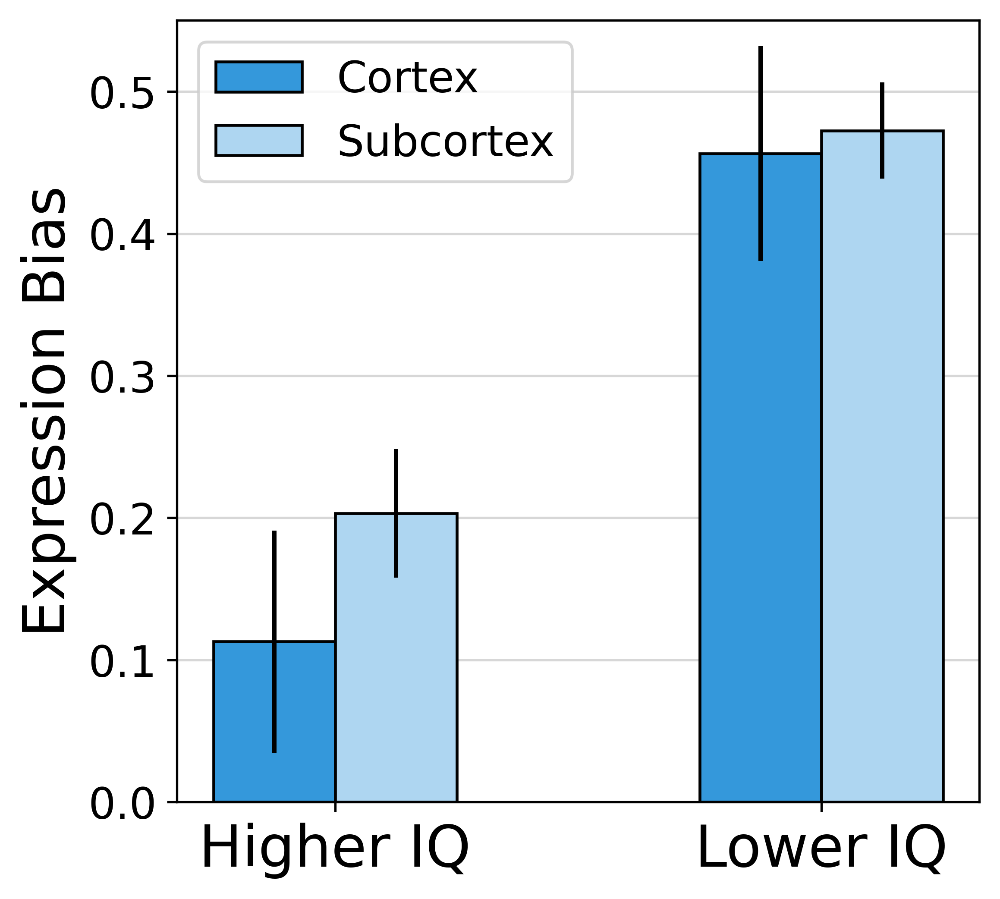

In [42]:
fig, ax = plt.subplots(dpi=480, figsize=(5,5))
X = np.arange(2)
ax.bar(X - 0.125, data[0], yerr=error1, color='#3498DB', width=0.25, label="Cortex", edgecolor ='black',
      hatch="")
ax.bar(X + 0.125, data[1], yerr=error2, color='#AED6F1', width=0.25, label="Subcortex", edgecolor ='black',
      hatch="")

props = {'connectionstyle':'bar','arrowstyle':'-',\
             'shrinkA':20,'shrinkB':20,'linewidth':2}
plt.xlabel('', fontweight ='bold', fontsize = 20)
plt.ylabel('Expression Bias', fontsize = 20)
plt.xticks(X, ['Higher IQ', 'Lower IQ'], fontsize=20)
plt.yticks(fontsize=15)
ax.set_ylim(0,0.55)
plt.legend(loc="upper left", fontsize=15)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)

In [43]:
color_map = {"HIQ":"blue", 
             "LIQ":"red"}
CIR_REGIONS = ['Isocortex', 'Hippocampus', 
     'Cortical_subplate', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']
data2 = []
for group in ["HIQ", "LIQ"]:
    tmp = []
    for Narrow in CIR_REGIONS:
        tmp.append(np.median(REG_Layer1[Narrow][group]))
    data2.append(tmp)
data2 = np.array(data2)
#data2 = data.transpose()

CIR_REGIONS_Dict = {}
for i in range(len(CIR_REGIONS)):
    CIR_REGIONS_Dict[CIR_REGIONS[i]] = []
for _str in Circuit_STRs:
    for i in range(len(CIR_REGIONS)):
        if str2reg[_str] == CIR_REGIONS[i]:
            CIR_REGIONS_Dict[CIR_REGIONS[i]].append(_str)
            break
HighIQ_dat = []
LowIQ_dat = []
HighIQ_err = []
LowIQ_err = []
for REG in CIR_REGIONS:
    xx = GetBootsDist(HIQ_DFs, CIR_REGIONS_Dict[REG])
    HighIQ_err.append(np.std(xx))
    xx = GetBootsDist(LIQ_DFs, CIR_REGIONS_Dict[REG])
    LowIQ_err.append(np.std(xx))
    HighIQ_dat.append(GetBiasDat(HIQ_Spec, CIR_REGIONS_Dict[REG]))
    LowIQ_dat.append(GetBiasDat(LIQ_Spec, CIR_REGIONS_Dict[REG]))
LowIQ_dat = np.array(LowIQ_dat)
HighIQ_dat = np.array(HighIQ_dat)
HighIQ_err = np.array(HighIQ_err)
LowIQ_err = np.array(LowIQ_err)            

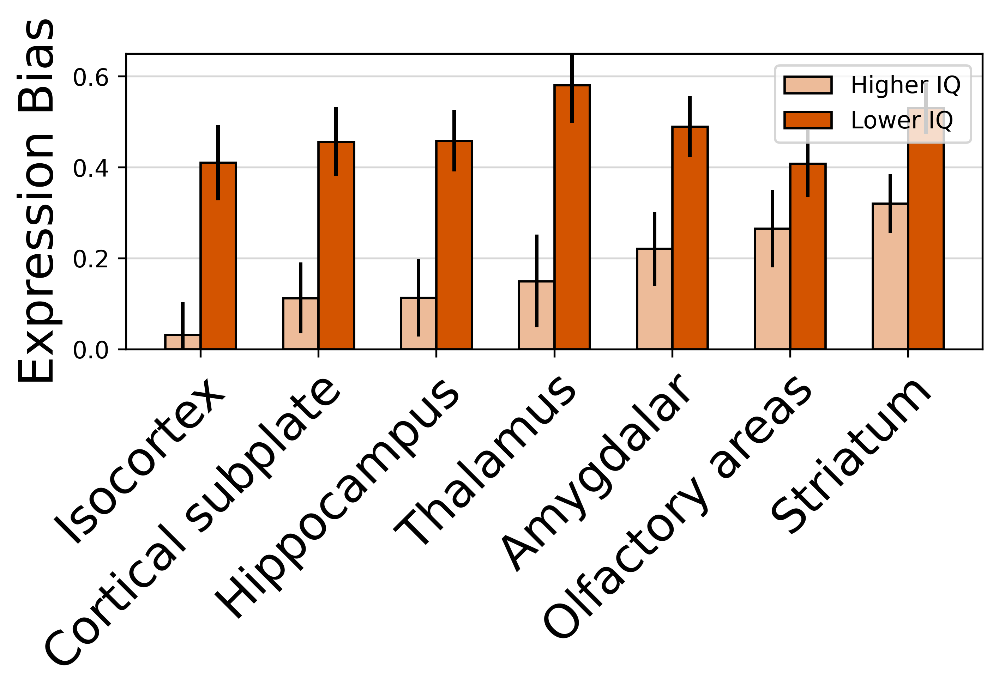

In [44]:
sort_idx = np.argsort(HighIQ_dat)
CIR_REGIONS__ = np.array(CIR_REGIONS)
fig, ax = plt.subplots(dpi=480)

X = np.arange(len(CIR_REGIONS))

ax.bar(X - 0.15, HighIQ_dat[sort_idx], yerr=HighIQ_err[sort_idx], color="#EDBB99", width=0.3, label="Higher IQ", 
       edgecolor ='black')
ax.bar(X + 0.15, LowIQ_dat[sort_idx], yerr=LowIQ_err[sort_idx], color="#D35400", width=0.3, label="Lower IQ", 
   edgecolor ='black', hatch="")

ax.set_xlabel('', fontweight ='bold', fontsize = 20)
ax.set_ylabel('Expression Bias', fontsize = 20)
#plt.xticks(X, CIR_REGIONS__[sort_idx], rotation=45, fontsize=10, ha='right', rotation_mode="anchor")
plt.xticks(X, ["Isocortex", "Cortical subplate", "Hippocampus", 
              "Thalamus", "Amygdalar", "Olfactory areas", "Striatum"], 
           rotation=45, fontsize=20, ha='right', rotation_mode="anchor")
  
ax.legend()
plt.tight_layout()
ax.set_ylim(0, 0.65)
ax.grid(True, axis="y", alpha=0.5)
ax.set_axisbelow(True)
#pdf.savefig( fig )

# Supplementary Figures

#### Gene top5 expression bias versus expression level. 

In [195]:
def topNSpect(Mat, GeneSet, topN=5):
    topSpecs = []
    topSelectSpec = []
    idx_all = []
    idx_select = []
    for i, g in enumerate(Mat.index.values):
        exps = [x for x in Mat.loc[g, :].values if x == x]
        exps.sort()
        top5_spec = np.mean(exps[-topN:])
        topSpecs.append(top5_spec)
        idx_all.append(i)
        if g in GeneSet:
            topSelectSpec.append(top5_spec)
            idx_select.append(i)
    return idx_all, topSpecs, idx_select, topSelectSpec

def topNSpecVsExpLevel(MatSpec, MatLevel, GeneSet, topN=5):
    expLevel = []
    topSpecs = []
    topSelectSpec = []
    expLevelSelect = []
    idx_all = []
    idx_select = []
    for i, g in enumerate(MatSpec.index.values):
        spec = [x for x in MatSpec.loc[g, :].values if x == x]
        spec.sort()
        top5_spec = np.mean(spec[-topN:])
        topSpecs.append(top5_spec)
        idx_all.append(i)
        exp = MatLevel.loc[g, :].mean()
        expLevel.append(exp)
        if g in GeneSet:
            topSelectSpec.append(top5_spec)
            idx_select.append(i)
            expLevelSelect.append(exp)
    return idx_all, topSpecs, expLevel, idx_select, topSelectSpec, expLevelSelect

In [199]:
Spark_Meta_2stage = pd.read_excel("../dat/genes/asd/TabS_DenovoWEST_Stage1+2.xlsx",
                           skiprows=2, sheet_name="TopDnEnrich")
Spark_Meta_ExomeWide = Spark_Meta_2stage[Spark_Meta_2stage["pDenovoWEST_Meta"]<=1.3e-6]
GeneSet = set(Spark_Meta_ExomeWide["EntrezID"].values)
idx_all, topSpecs, expLevel, idx_select, topSelectSpec, expLevelSelect = topNSpecVsExpLevel(
    ExpZ2, ExpL, GeneSet, topN=5)
sibling_genes = pd.read_csv("../dat/Unionize_bias/sibling_weights_LGD_Dmis.csv", index_col=0).index.values
idx_all, topSpecs, expLevel, idx_select2, topSelectSpec2, expLevelSelect2 = topNSpecVsExpLevel(
    ExpZ2, ExpL, sibling_genes, topN=5)

In [200]:
def eeee(expLevelSelect, topSelectSpec, expLevelSelect2, topSelectSpec2, cutoff=1):
    xx1, xx2 = [], []
    yy1, yy2 = [], []
    for level, bias in zip(expLevelSelect, topSelectSpec):
        if level > cutoff:
            xx2.append(bias)
        else:
            xx1.append(bias)
    for level, bias in zip(expLevelSelect2, topSelectSpec2):
        if level > cutoff:
            yy2.append(bias)
        else:
            yy1.append(bias)
    print(np.mean(topSelectSpec), np.mean(xx1), np.mean(xx2))
    print(np.mean(topSelectSpec2), np.mean(yy1), np.mean(yy2))
eeee(expLevelSelect, topSelectSpec, expLevelSelect2, topSelectSpec2, cutoff=1)

2.2519899484596198 2.799166519193926 2.053016650010781
2.918589075736869 3.4832381057160697 2.125844199983892


SpearmanrResult(correlation=-0.6675187552097807, pvalue=5.709446270901166e-09)


Text(0, 0.5, 'Mean Top 5 Expression Bias')

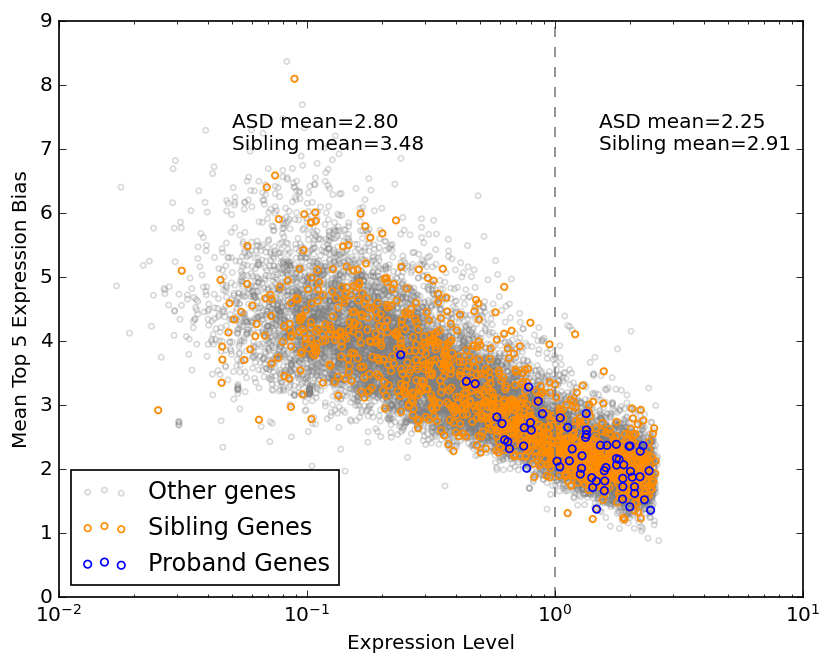

In [202]:
plt.style.use('classic')
ax.set_facecolor('white')
fig, ax = plt.subplots(dpi=120)
fig.patch.set_facecolor('white')
ax.scatter(expLevel, topSpecs, s=10, color="grey", marker="o", facecolors='none', alpha=0.3,
          label="Other genes")
ax.scatter(expLevelSelect2, topSelectSpec2, s=15, color="darkorange", marker="o", alpha=1, 
            facecolors='none', label="Sibling Genes")
ax.scatter(expLevelSelect, topSelectSpec, s=20, color="blue", marker="o", 
            facecolors='none', label="Proband Genes")
ax.annotate(xy=(0.05,7), text="ASD mean=2.80\nSibling mean=3.48")
ax.annotate(xy=(1.5,7), text="ASD mean=2.25\nSibling mean=2.91")
ax.vlines(ymin=0, ymax=10, x=1, color="grey", ls="dashed")
print(spearmanr(expLevelSelect, topSelectSpec))
ax.set_xlabel("Expression Level")
ax.set_ylim(0, 9)
ax.set_xscale('log')
plt.legend(loc="lower left")
plt.grid(False)
ax.set_ylabel("Mean Top 5 Expression Bias")

#### Structure overlap among different ASD genesets. 

In [203]:
Spark_Meta_1stage = pd.read_excel("~/Work/SPARK2020/TabS_DenovoWEST_Stage1.xlsx",
                           skiprows=1, sheet_name="AllGenes")
#ASD_Meta = pd.read_csv("dat/bias2/ASD.EW.pLI.z2.csv", index_col='STR')
ASD_Meta = pd.read_csv("../dat/Unionize_bias/Spark_Meta_EWS.Z2.bias.FDR.v2.csv", index_col='STR')

NGenes = 159
# Gene weights
_, Agg_gene2MutN = Aggregate_Gene_Weights2(Spark_Meta_1stage.head(NGenes), 
          allen_mouse_genes = allen_mouse_genes, 
          out = "../dat/Unionize_bias//xx.Spark_Meta_{}.GeneWeight.csv".format(NGenes))
ASD_159 = AvgSTRZ_Weighted(ExpZ2, Agg_gene2MutN, Method = 1, NonNeg=False, 
                            csv_fil = "../dat/Unionize_bias/ASD.{}.pLI.z2.csv".format(NGenes))

NGenes = 676
# Gene weights
_, Agg_gene2MutN = Aggregate_Gene_Weights2(Spark_Meta_1stage.head(NGenes), 
          allen_mouse_genes = allen_mouse_genes, 
          out = "../dat/Unionize_bias/xx.Spark_Meta_{}.GeneWeight.csv".format(NGenes))
ASD_676 = AvgSTRZ_Weighted(ExpZ2, Agg_gene2MutN, Method = 1, NonNeg=False, 
                            csv_fil = "../dat/Unionize_bias/ASD.{}.pLI.z2.csv".format(NGenes))

NGenes = 20000
_, Agg_gene2MutN = Aggregate_Gene_Weights2(Spark_Meta_1stage.head(NGenes), 
          allen_mouse_genes = allen_mouse_genes, 
          out = "../dat/Unionize_bias/xx.Spark_Meta_{}.GeneWeight.csv".format(NGenes))
ASD_All = AvgSTRZ_Weighted(ExpZ2, Agg_gene2MutN, Method = 1, NonNeg=False, 
                            csv_fil = "../dat/Unionize_bias/ASD.{}.pLI.z2.csv".format(NGenes))

23126 not in allen mouse dataset
27086 not in allen mouse dataset
287 not in allen mouse dataset
3008 not in allen mouse dataset
3008 don't have pLI score on file, set to 0
23096 not in allen mouse dataset
7314 not in allen mouse dataset
10847 not in allen mouse dataset
256158 not in allen mouse dataset
293 not in allen mouse dataset
90167 not in allen mouse dataset
158405 not in allen mouse dataset
23392 not in allen mouse dataset
58491 not in allen mouse dataset
23126 not in allen mouse dataset
27086 not in allen mouse dataset
287 not in allen mouse dataset
3008 not in allen mouse dataset
3008 don't have pLI score on file, set to 0
23096 not in allen mouse dataset
7314 not in allen mouse dataset
10847 not in allen mouse dataset
256158 not in allen mouse dataset
293 not in allen mouse dataset
90167 not in allen mouse dataset
158405 not in allen mouse dataset
23392 not in allen mouse dataset
58491 not in allen mouse dataset
6339 not in allen mouse dataset
8125 not in allen mouse datase

115677 not in allen mouse dataset
79750 not in allen mouse dataset
55758 not in allen mouse dataset
643847 not in allen mouse dataset
9906 not in allen mouse dataset
5222 not in allen mouse dataset
201161 not in allen mouse dataset
346606 not in allen mouse dataset
79616 not in allen mouse dataset
126248 not in allen mouse dataset
169270 not in allen mouse dataset
53840 not in allen mouse dataset
8174 not in allen mouse dataset
284958 not in allen mouse dataset
284759 not in allen mouse dataset
2853 not in allen mouse dataset
200895 not in allen mouse dataset
126204 not in allen mouse dataset
221786 not in allen mouse dataset
147694 not in allen mouse dataset
9997 not in allen mouse dataset
161882 not in allen mouse dataset
126326 not in allen mouse dataset
7652 not in allen mouse dataset
81545 not in allen mouse dataset
1120 not in allen mouse dataset
88455 not in allen mouse dataset
425054 not in allen mouse dataset
283316 not in allen mouse dataset
22976 not in allen mouse dataset
5

8366 not in allen mouse dataset
163051 not in allen mouse dataset
54798 not in allen mouse dataset
23067 not in allen mouse dataset
6473 not in allen mouse dataset
284257 not in allen mouse dataset
728741 not in allen mouse dataset
8091 not in allen mouse dataset
9898 not in allen mouse dataset
55660 not in allen mouse dataset
131405 not in allen mouse dataset
730 not in allen mouse dataset
284254 not in allen mouse dataset
440854 not in allen mouse dataset
283455 not in allen mouse dataset
147646 not in allen mouse dataset
390940 not in allen mouse dataset
728224 not in allen mouse dataset
503834 not in allen mouse dataset
79839 not in allen mouse dataset
63920 not in allen mouse dataset
93432 not in allen mouse dataset
2312 not in allen mouse dataset
126205 not in allen mouse dataset
388939 not in allen mouse dataset
348180 not in allen mouse dataset
10216 not in allen mouse dataset
57558 not in allen mouse dataset
388698 not in allen mouse dataset
2196 not in allen mouse dataset
105

93099 not in allen mouse dataset
126068 not in allen mouse dataset
5420 not in allen mouse dataset
7596 not in allen mouse dataset
9668 not in allen mouse dataset
340273 not in allen mouse dataset
984 not in allen mouse dataset
65988 not in allen mouse dataset
414189 not in allen mouse dataset
57691 not in allen mouse dataset
114132 not in allen mouse dataset
7582 not in allen mouse dataset
9422 not in allen mouse dataset
113179 not in allen mouse dataset
7520 not in allen mouse dataset
149647 not in allen mouse dataset
80129 not in allen mouse dataset
343578 not in allen mouse dataset
353355 not in allen mouse dataset
317762 not in allen mouse dataset
7564 not in allen mouse dataset
9221 not in allen mouse dataset
3270 not in allen mouse dataset
7581 not in allen mouse dataset
29102 not in allen mouse dataset
80352 not in allen mouse dataset
83889 not in allen mouse dataset
79699 not in allen mouse dataset
84622 not in allen mouse dataset
284443 not in allen mouse dataset
26152 not in

3002 not in allen mouse dataset
151790 not in allen mouse dataset
285242 not in allen mouse dataset
56129 not in allen mouse dataset
51032 not in allen mouse dataset
160287 not in allen mouse dataset
388591 not in allen mouse dataset
54809 not in allen mouse dataset
3237 not in allen mouse dataset
170487 not in allen mouse dataset
387597 not in allen mouse dataset
374875 not in allen mouse dataset
9098 not in allen mouse dataset
26166 not in allen mouse dataset
79981 not in allen mouse dataset
84865 not in allen mouse dataset
57482 not in allen mouse dataset
85366 not in allen mouse dataset
55578 not in allen mouse dataset
91607 not in allen mouse dataset
91646 not in allen mouse dataset
339766 not in allen mouse dataset
3293 not in allen mouse dataset
113730 not in allen mouse dataset
341350 not in allen mouse dataset
60495 not in allen mouse dataset
3857 not in allen mouse dataset
9322 not in allen mouse dataset
10168 not in allen mouse dataset
10848 not in allen mouse dataset
64420 

830 not in allen mouse dataset
2313 not in allen mouse dataset
3895 not in allen mouse dataset
6191 not in allen mouse dataset
55593 not in allen mouse dataset
58517 not in allen mouse dataset
8611 not in allen mouse dataset
656 not in allen mouse dataset
1365 not in allen mouse dataset
8233 not in allen mouse dataset
22874 not in allen mouse dataset
81876 not in allen mouse dataset
115704 not in allen mouse dataset
1991 not in allen mouse dataset
161725 not in allen mouse dataset
139596 not in allen mouse dataset
1112 not in allen mouse dataset
6122 not in allen mouse dataset
55752 not in allen mouse dataset
2091 not in allen mouse dataset
80725 not in allen mouse dataset
3178 not in allen mouse dataset
4211 not in allen mouse dataset
2275 not in allen mouse dataset
9147 not in allen mouse dataset
1896 not in allen mouse dataset
81894 not in allen mouse dataset
63947 not in allen mouse dataset
5342 not in allen mouse dataset
727866 not in allen mouse dataset
1667 not in allen mouse da

10896 not in allen mouse dataset
284276 not in allen mouse dataset
388507 not in allen mouse dataset
645996 not in allen mouse dataset
150590 not in allen mouse dataset
3443 not in allen mouse dataset
245936 not in allen mouse dataset
645840 not in allen mouse dataset
280636 not in allen mouse dataset
245937 not in allen mouse dataset
259239 not in allen mouse dataset
521 not in allen mouse dataset
644809 not in allen mouse dataset
6291 not in allen mouse dataset
81872 not in allen mouse dataset
54494 not in allen mouse dataset
283422 not in allen mouse dataset
152065 not in allen mouse dataset
440087 not in allen mouse dataset
55472 not in allen mouse dataset
7454 not in allen mouse dataset
160065 not in allen mouse dataset
222659 not in allen mouse dataset
340204 not in allen mouse dataset
5619 not in allen mouse dataset
286530 not in allen mouse dataset
280664 not in allen mouse dataset
3444 not in allen mouse dataset
283598 not in allen mouse dataset
255626 not in allen mouse datas

152756 not in allen mouse dataset
94235 not in allen mouse dataset
85014 not in allen mouse dataset
11026 not in allen mouse dataset
148003 not in allen mouse dataset
339184 not in allen mouse dataset
129868 not in allen mouse dataset
3445 not in allen mouse dataset
6348 not in allen mouse dataset
140870 not in allen mouse dataset
642819 not in allen mouse dataset
401115 not in allen mouse dataset
339883 not in allen mouse dataset
492307 not in allen mouse dataset
171483 not in allen mouse dataset
90736 not in allen mouse dataset
10344 not in allen mouse dataset
51327 not in allen mouse dataset
147184 not in allen mouse dataset
337880 not in allen mouse dataset
140290 not in allen mouse dataset
122665 not in allen mouse dataset
56891 not in allen mouse dataset
145946 not in allen mouse dataset
728318 not in allen mouse dataset
6037 not in allen mouse dataset
56918 not in allen mouse dataset
245913 not in allen mouse dataset
170591 not in allen mouse dataset
6373 not in allen mouse data

10597 not in allen mouse dataset
84084 not in allen mouse dataset
256710 not in allen mouse dataset
168374 not in allen mouse dataset
148109 not in allen mouse dataset
9235 not in allen mouse dataset
284293 not in allen mouse dataset
200765 not in allen mouse dataset
51744 not in allen mouse dataset
503627 not in allen mouse dataset
8344 not in allen mouse dataset
653427 not in allen mouse dataset
645027 not in allen mouse dataset
129787 not in allen mouse dataset
26526 not in allen mouse dataset
7634 not in allen mouse dataset
57817 not in allen mouse dataset
54830 not in allen mouse dataset
5545 not in allen mouse dataset
8744 not in allen mouse dataset
9436 not in allen mouse dataset
26157 not in allen mouse dataset
25770 not in allen mouse dataset
137797 not in allen mouse dataset
285955 not in allen mouse dataset
157848 not in allen mouse dataset
727832 not in allen mouse dataset
4332 not in allen mouse dataset
7388 not in allen mouse dataset
146540 not in allen mouse dataset
1305

1443 not in allen mouse dataset
147686 not in allen mouse dataset
203068 not in allen mouse dataset
55798 not in allen mouse dataset
126231 not in allen mouse dataset
494188 not in allen mouse dataset
1557 not in allen mouse dataset
57801 not in allen mouse dataset
54729 not in allen mouse dataset
7746 not in allen mouse dataset
8896 not in allen mouse dataset
57820 not in allen mouse dataset
399671 not in allen mouse dataset
728621 not in allen mouse dataset
8352 not in allen mouse dataset
5444 not in allen mouse dataset
139425 not in allen mouse dataset
253650 not in allen mouse dataset
114821 not in allen mouse dataset
374899 not in allen mouse dataset
80110 not in allen mouse dataset
267004 not in allen mouse dataset
138715 not in allen mouse dataset
8969 not in allen mouse dataset
645369 not in allen mouse dataset
2689 not in allen mouse dataset
375298 not in allen mouse dataset
85481 not in allen mouse dataset
440107 not in allen mouse dataset
89 not in allen mouse dataset
728577

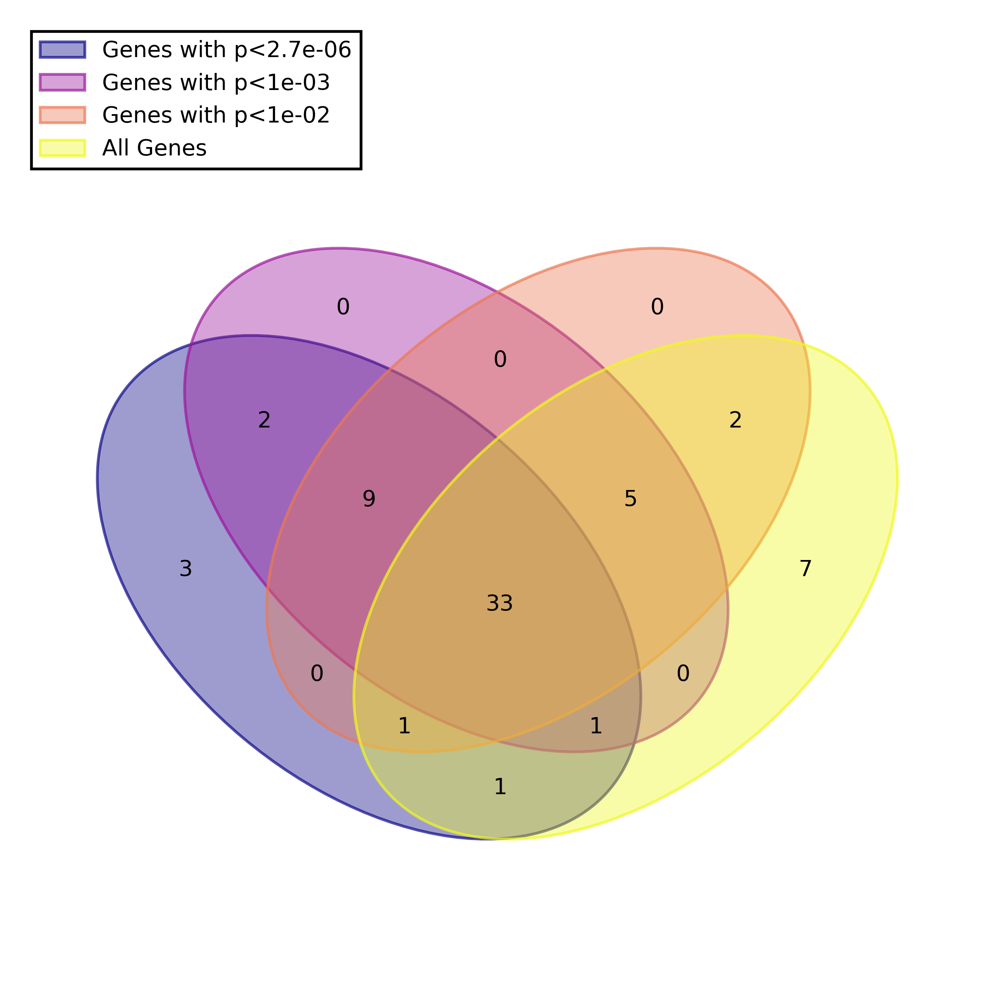

In [204]:
from venn import venn
dataset_dict = {"Genes with p<2.7e-06": set(ASD_Meta.head(50).index.values), 
                "Genes with p<1e-03": set(ASD_159.head(50)["STR"].values), 
                "Genes with p<1e-02": set(ASD_676.head(50)["STR"].values), 
                "All Genes": set(ASD_All.head(50)["STR"].values), 
               }
cmaps = ["cool", list("rgb"), "plasma", "viridis", "Set1"]
fig, ax = plt.subplots(dpi=480)
fig.patch.set_facecolor('white')
v = venn(dataset_dict, fontsize=8, ax=ax, 
     legend_loc="upper left", cmap="plasma")

#### Normalization for neuronal density and neuron-to-glia ratio.

In [4]:
ASD_Bias = pd.read_csv("../dat/Unionize_bias/Spark_Meta_EWS.Z2.bias.FDR.csv", index_col="STR")
ASD_Neuron_den_norm_bias = pd.read_csv("../dat/Unionize_bias/ASD.neuron.density.norm.bias.csv", 
                                      index_col="STR")
ASD_Glia_norm_bias = pd.read_csv("../dat/Unionize_bias/ASD.neuro2glia.norm.bias.csv", 
                                      index_col="STR")

In [5]:
dat1, dat2 = [], []
for STR in ASD_Bias.index.values:
    bias1 = ASD_Bias.loc[STR, "EFFECT"]
    bias2 = ASD_Neuron_den_norm_bias.loc[STR, "EFFECT"]
    dat1.append(bias1)
    dat2.append(bias2)
dat11, dat22 = [], []
for STR in ASD_Bias.index.values:
    bias1 = ASD_Bias.loc[STR, "EFFECT"]
    bias2 = ASD_Glia_norm_bias.loc[STR, "EFFECT"]
    dat11.append(bias1)
    dat22.append(bias2)

In [6]:
#print(pearsonr(dat1,dat2))
#print()
r1, p1 = pearsonr(dat1,dat2)
r2, p2 = pearsonr(dat11,dat22)

In [7]:
def addxeqy(ax):
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
    ]
    # now plot both limits against eachother
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)

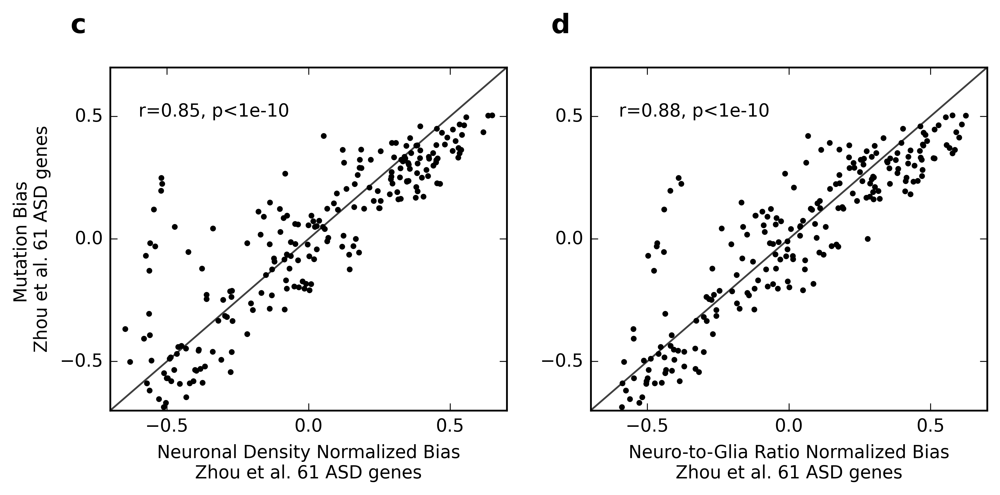

In [8]:
plt.style.use('classic')
fig, (ax1, ax2) = plt.subplots(1,2,dpi=480, figsize=(8,4))
fig.set_facecolor('white')
ax1.scatter(dat2, dat1, s=5, color="black")
ax2.scatter(dat22, dat11, s=5, color="black")
addxeqy(ax1)
addxeqy(ax2)
ax1.set_xlabel("Neuronal Density Normalized Bias\nZhou et al. 61 ASD genes")
ax2.set_xlabel("Neuro-to-Glia Ratio Normalized Bias\nZhou et al. 61 ASD genes")
ax1.set_ylabel("Mutation Bias \nZhou et al. 61 ASD genes")
#ax1.text(x=-0.6, y=0.5, s="r=%.2f, p=%.1e"%(r1, p1))
#ax2.text(x=-0.6, y=0.5, s="r=%.2f, p=%.1e"%(r2, p2))
ax1.text(x=-0.6, y=0.5, s="r=%.2f, p<%.0e"%(r1, 1e-10))
ax2.text(x=-0.6, y=0.5, s="r=%.2f, p<%.0e"%(r2, 1e-10))
import string
ax1.text(-0.1, 1.1, string.ascii_lowercase[2], transform=ax1.transAxes, 
            size=15, weight='bold')
ax2.text(-0.1, 1.1, string.ascii_lowercase[3], transform=ax2.transAxes, 
            size=15, weight='bold')
plt.tight_layout()
ax1.locator_params(nbins=6)
ax2.locator_params(nbins=6)
ax1.set_ylim(-0.7, 0.7)
ax1.set_xlim(-0.7, 0.7)
ax2.set_ylim(-0.7, 0.7)
ax2.set_xlim(-0.7, 0.7)
plt.show()

#### ASC 102, Spark 159, Spark 61

In [100]:
ASD_Bias = pd.read_csv("../dat/Unionize_bias/Spark_Meta_EWS.Z2.bias.FDR.csv", index_col="STR")
ASD_ASC = pd.read_csv("../dat/Unionize_bias/ASD.ASC102.Z2.bias.csv", 
                                      index_col="STR")
ASD_159 = pd.read_csv("../dat/Unionize_bias/ASD.159.pLI.z2.csv", 
                                      index_col="STR")

In [101]:
dat1, dat2 = [], []
for STR in ASD_Bias.index.values:
    bias1 = ASD_Bias.loc[STR, "EFFECT"]
    bias2 = ASD_ASC.loc[STR, "EFFECT"]
    dat1.append(bias1)
    dat2.append(bias2)
dat11, dat22 = [], []
for STR in ASD_Bias.index.values:
    bias1 = ASD_Bias.loc[STR, "EFFECT"]
    bias2 = ASD_159.loc[STR, "EFFECT"]
    dat11.append(bias1)
    dat22.append(bias2)

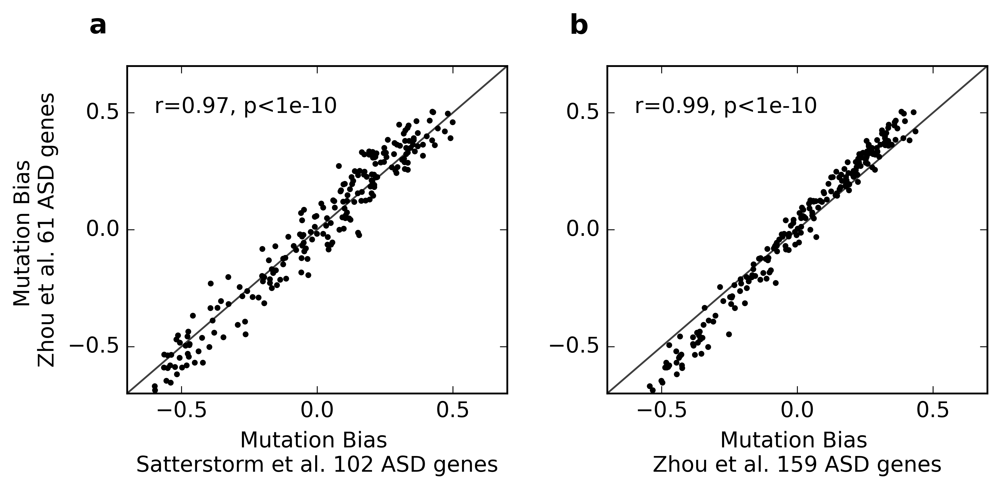

In [102]:
r1, p1 = pearsonr(dat1,dat2)
r2, p2 = pearsonr(dat11,dat22)

plt.style.use('classic')
fig, (ax1, ax2) = plt.subplots(1,2,dpi=480, figsize=(8,4))
fig.set_facecolor('white')
ax1.scatter(dat2, dat1, s=5, color="black")
ax2.scatter(dat22, dat11, s=5, color="black")

ax1.set_xlabel("Mutation Bias \nSatterstorm et al. 102 ASD genes")
ax2.set_xlabel("Mutation Bias \nZhou et al. 159 ASD genes")
ax1.set_ylabel("Mutation Bias \nZhou et al. 61 ASD genes")
ax1.text(x=-0.6, y=0.5, s="r=%.2f, p<%.0e"%(r1, 1e-10))
ax2.text(x=-0.6, y=0.5, s="r=%.2f, p<%.0e"%(r2, 1e-10))
import string
ax1.text(-0.1, 1.1, string.ascii_lowercase[0], transform=ax1.transAxes, 
            size=15, weight='bold')
ax2.text(-0.1, 1.1, string.ascii_lowercase[1], transform=ax2.transAxes, 
            size=15, weight='bold')
plt.tight_layout()
ax1.locator_params(nbins=6)
ax2.locator_params(nbins=6)
ax1.set_ylim(-0.7, 0.7)
ax1.set_xlim(-0.7, 0.7)
ax2.set_ylim(-0.7, 0.7)
ax2.set_xlim(-0.7, 0.7)
addxeqy(ax1)
addxeqy(ax2)
plt.show()

#### Male vs Female

In [103]:
ASD_Male = pd.read_csv("../dat/Unionize_bias/ASD.Male.ALL.bias.csv", 
                                      index_col="STR")
ASD_Female = pd.read_csv("../dat/Unionize_bias/ASD.Female.ALL.bias.csv", 
                                      index_col="STR")

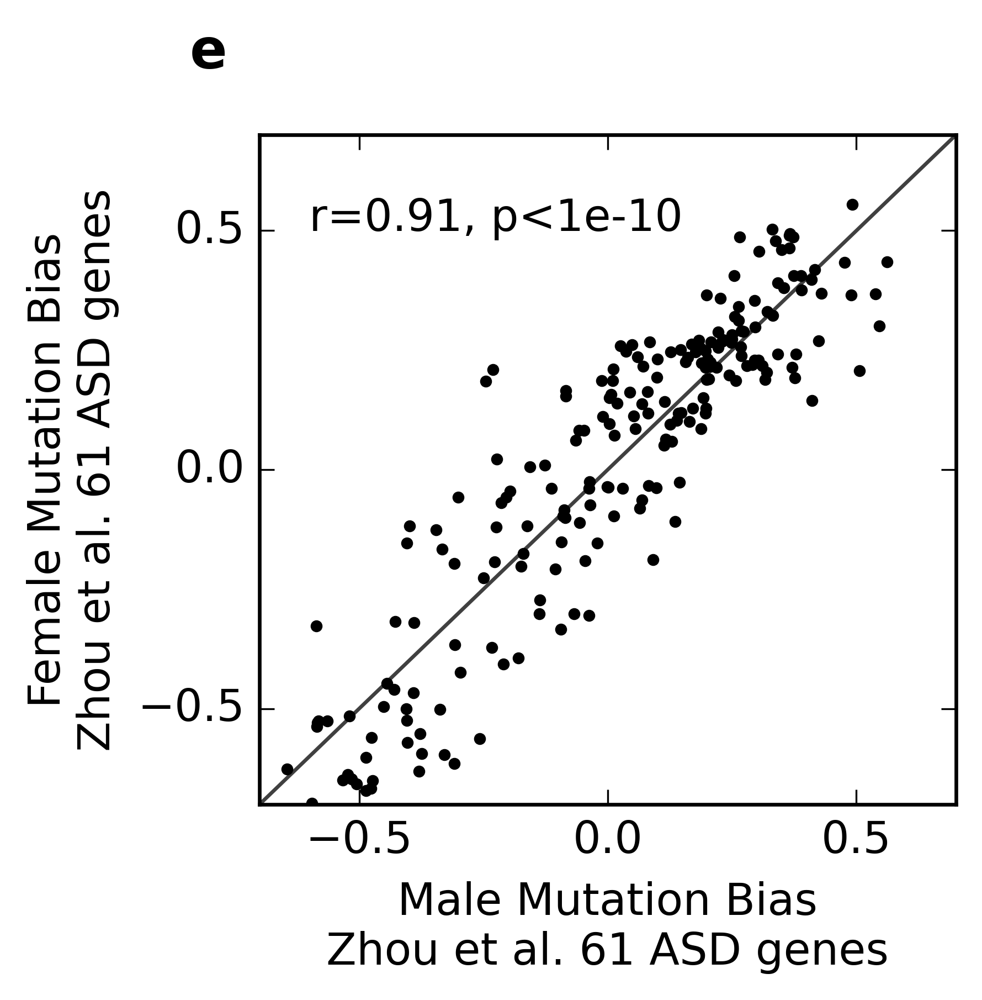

In [104]:
dat1, dat2 = [], []
for STR in ASD_Bias.index.values:
    bias1 = ASD_Male.loc[STR, "EFFECT"]
    bias2 = ASD_Female.loc[STR, "EFFECT"]
    dat1.append(bias1)
    dat2.append(bias2)
r1, p1 = pearsonr(dat1,dat2)

plt.style.use('classic')
fig, ax1 = plt.subplots(dpi=480, figsize=(4,4))
fig.set_facecolor('white')
ax1.scatter(dat1, dat2, s=5, color="black")

ax1.set_xlabel("Male Mutation Bias\nZhou et al. 61 ASD genes")
ax1.set_ylabel("Female Mutation Bias\nZhou et al. 61 ASD genes")
ax1.text(x=-0.6, y=0.5, s="r=%.2f, p<%.0e"%(r1, 1e-10))
import string
ax1.text(-0.1, 1.1, string.ascii_lowercase[4], transform=ax1.transAxes, 
            size=15, weight='bold')

plt.tight_layout()
ax1.locator_params(nbins=6)

ax1.set_ylim(-0.7, 0.7)
ax1.set_xlim(-0.7, 0.7)

addxeqy(ax1)

plt.show()

#### Disttance/Weights distribution between ASD and Sib

In [145]:
W_Ipsi = pd.read_csv(
    "/home/jw3514/Work/ASD_Circuits/dat/allen-mouse-conn/ScoreingMat_jw_v3/WeightMat.Ipsi.csv", index_col=0)
D_ipsi = pd.read_csv(
    "/home/jw3514/Work/ASD_Circuits/dat/allen-mouse-conn/Dist_CartesianDistance.ipsi.csv", index_col=0)
D_ipsi.columns = D_ipsi.index.values
ASD_CircuitsSet = pd.read_csv(
    "/home/jw3514/Work/ASD_Circuits/notebooks/ASD.SA.Circuits.Size46.csv",
    index_col="idx")
ASD_Circuits = ASD_CircuitsSet.loc[3, "STRs"].split(";")
SIB_Circuits = SIB_Bias.index.values[:46]

In [156]:
ASD_Ws = W_Ipsi.loc[ASD_Circuits, ASD_Circuits].values
SIB_Ws = W_Ipsi.loc[SIB_Circuits, SIB_Circuits].values
ASD_Dists = D_ipsi.loc[ASD_Circuits, ASD_Circuits].values
SIB_Dists = D_ipsi.loc[SIB_Circuits, SIB_Circuits].values
ASD_Dists = ASD_Dists[ASD_Ws>0].flatten()
SIB_Dists = SIB_Dists[SIB_Ws>0].flatten()

In [158]:
ASD_Ws = np.array([x for x in ASD_Ws.flatten() if x>0])
SIB_Ws = np.array([x for x in SIB_Ws.flatten() if x>0])

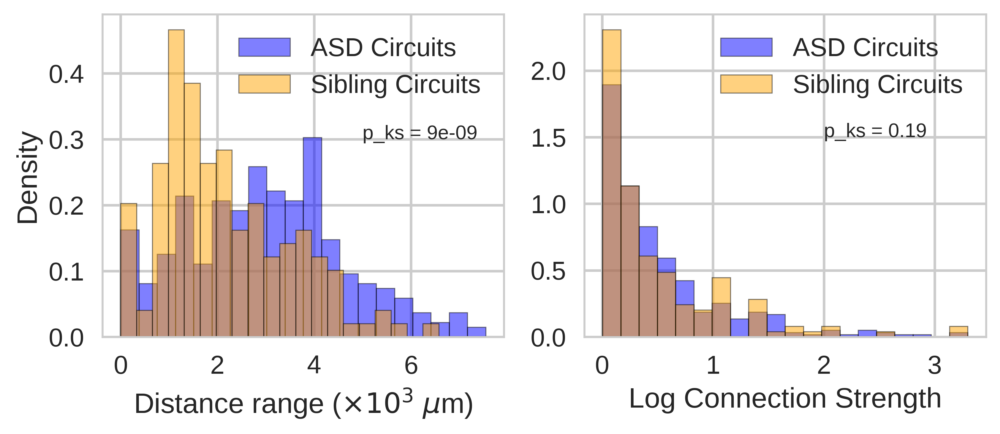

In [194]:
fig, (ax1, ax2) = plt.subplots(1,2, dpi=480, figsize=(8,3))
ax1.hist(ASD_Dists/1000, color="blue", alpha=0.5, density=1, bins=20, edgecolor="black", linewidth=0.5,
        label="ASD Circuits")
ax1.hist(SIB_Dists/1000, color="orange", alpha=0.5, density=1, bins=20, edgecolor="black", linewidth=0.5, 
        label="Sibling Circuits")
ax1.set_xlabel(r"Distance range ($\times 10^3$ $\mu$m)")
ax1.text(5, 0.3, s="p_ks = 9e-09", fontsize=10)
ax1.set_ylabel("Density")
ax1.legend()
data1 = np.log2(1+ASD_Ws)
data2 = np.log2(1+SIB_Ws)
ax2.hist(data1, color="blue", alpha=0.5, density=1, bins=20, edgecolor="black", linewidth=0.5,
        label="ASD Circuits")
ax2.hist(data2, color="orange", alpha=0.5, density=1, bins=20, edgecolor="black", linewidth=0.5, 
        label="Sibling Circuits")
ax2.set_xlabel("Log Connection Strength")
ax2.text(2, 1.5, s="p_ks = 0.19", fontsize=10)
ax2.legend()
plt.show()


In [166]:
scipy.stats.ks_2samp(ASD_Ws, SIB_Ws)

KstestResult(statistic=0.1031012070566388, pvalue=0.19367258610465532)

In [167]:
scipy.stats.ks_2samp(ASD_Dists, SIB_Dists)

KstestResult(statistic=0.297288765088208, pvalue=9.149073276759623e-09)

#### Centrality

In [148]:
g = LoadConnectome2(adj_mat) # Load Connectiome
for e in g.es:
    e["w2"] = 1/e["weight"]
connectome_bt = g.betweenness(weights='w2')
connectome_cl = g.closeness(weights='w2')

In [158]:
top_nodes = g.vs.select(label_in=Circuit_Nodes_GN)
g2 = g.subgraph(top_nodes)
nodes = g2.vs["label"]
circuit_bt = g2.betweenness(weights='w2')
circuit_cl = g2.closeness(weights='w2')
circuit_eigen = g2.eigenvector_centrality(weights='w2')

/Users/jiayao/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Weighted directed graph in eigenvector centrality at src/centrality/centrality_other.c:348
  


In [160]:
df_cir = pd.DataFrame(data={"STR": g2.vs["label"], "BW":circuit_bt, "CL":circuit_cl, 
                           "Eigen":circuit_eigen})
df_con = pd.DataFrame(data={"STR": g.vs["label"], "BW":connectome_bt, "CL":connectome_cl,})
df_cir = df_cir.set_index("STR")
df_con = df_con.set_index("STR")

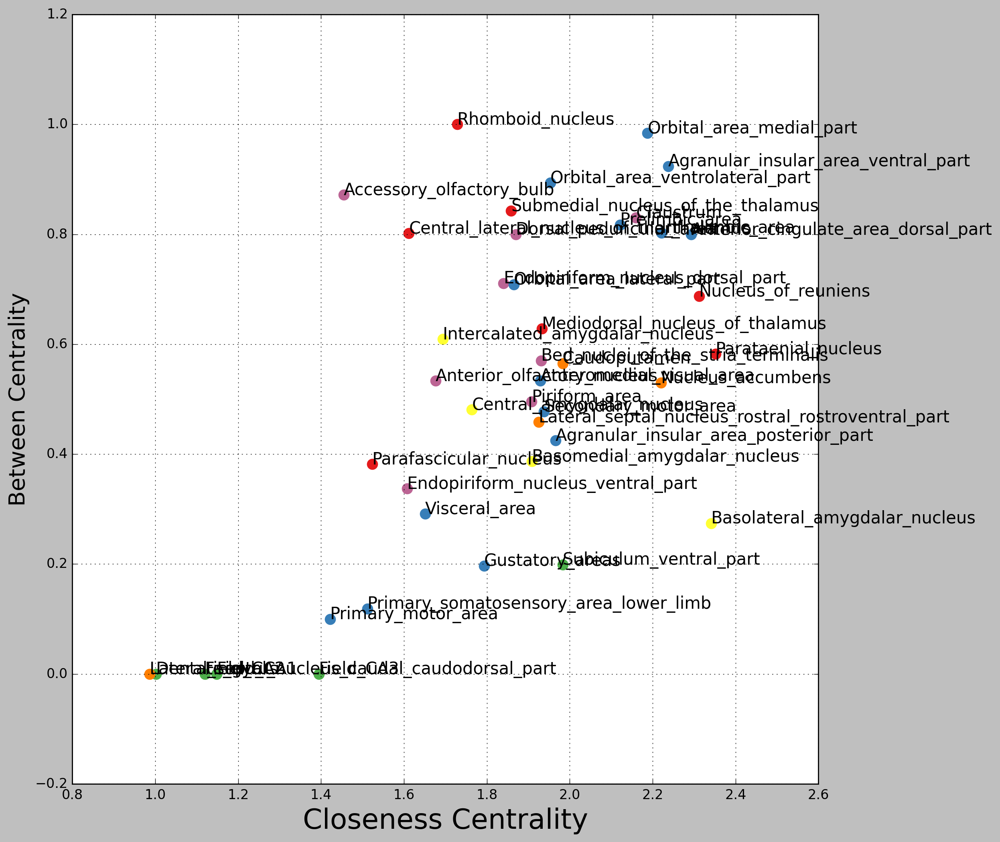

In [162]:
fig, ax = plt.subplots(dpi=200, figsize=(12,12))
color_dict = {"Isocortex":"#377eb8", "Thalamus": "#e41a1c", "Striatum":"#ff7f00", 
              "Olfactory_areas":"#BC6494", "Amygdalar": "#ffff33",
             "Hippocampus":"#4daf4a", 
              "Cortical_subplate":"#BC6494", "Pallidum": "#BC6494"}

for node, row in df_cir.iterrows():
    reg = str2reg[node]
    x = df_cir.loc[node, "CL"]
    y = df_cir.loc[node, "Eigen"]
    y = np.log2(y+1)
    ax.scatter(x, y, marker="o", color=color_dict[reg], s=80)
    ax.text(x, y, node, fontsize=15)
    
#lims = [np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
##        np.max([ax.get_xlim(), ax.get_ylim()]),]  # max of both axes]
#ax.plot(lims, lims, alpha=0.75, zorder=0, color="grey", ls="dashed")
#ax.set_xlim(lims)
#ax.set_ylim(lims)   

#ax.plot([0,2.6], [0,2.6], 'k-', alpha=0.75, zorder=0)
ax.set_xlabel("Closeness Centrality", fontsize=25)
ax.set_ylabel("Between Centrality", fontsize=20)
ax.grid(True)

#plt.savefig("Figs/Circuit.Degree.pdf")

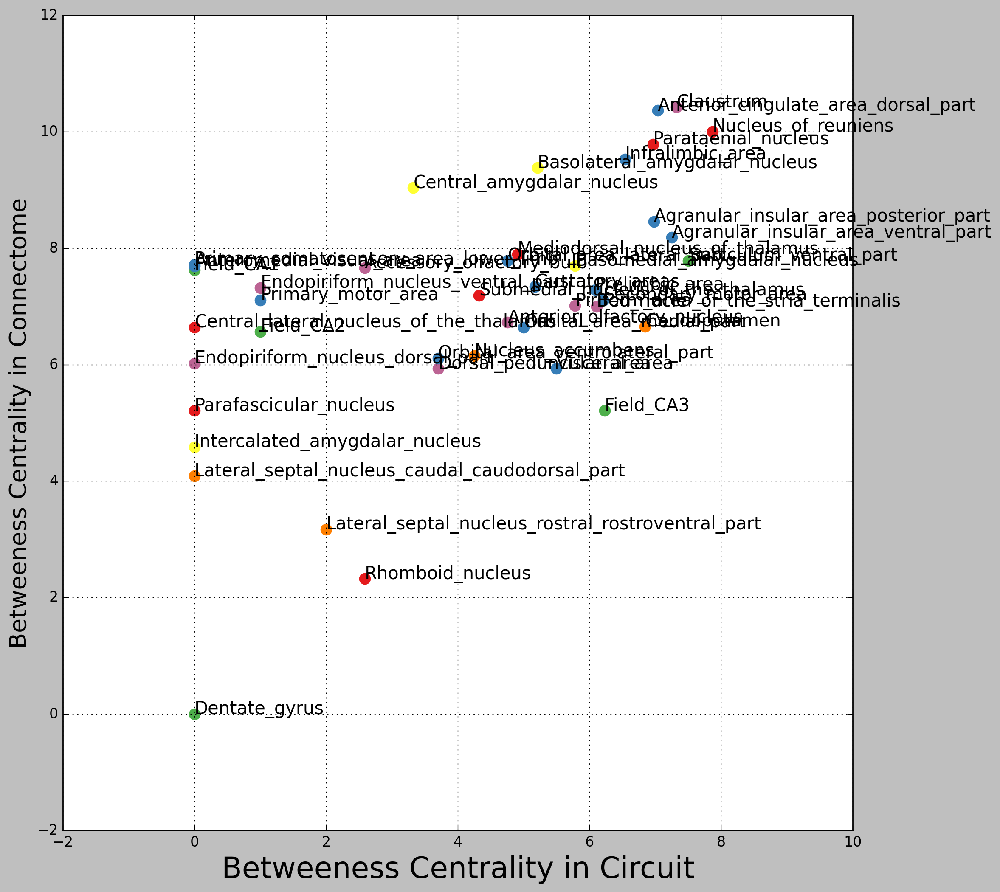

In [163]:
fig, ax = plt.subplots(dpi=200, figsize=(12,12))
color_dict = {"Isocortex":"#377eb8", "Thalamus": "#e41a1c", "Striatum":"#ff7f00", 
              "Olfactory_areas":"#BC6494", "Amygdalar": "#ffff33",
             "Hippocampus":"#4daf4a", 
              "Cortical_subplate":"#BC6494", "Pallidum": "#BC6494"}

for node, row in df_cir.iterrows():
    reg = str2reg[node]
    x = df_cir.loc[node, "BW"]
    y = df_con.loc[node, "BW"]
    x = np.log2(x+1)
    y = np.log2(y+1)
    ax.scatter(x, y, marker="o", color=color_dict[reg], s=80)
    ax.text(x, y, node, fontsize=15)

#ax.plot([0,2.6], [0,2.6], 'k-', alpha=0.75, zorder=0)
ax.set_xlabel("Betweeness Centrality in Circuit", fontsize=25)
ax.set_ylabel("Betweeness Centrality in Connectome", fontsize=20)
ax.grid(True)

KeyboardInterrupt: 

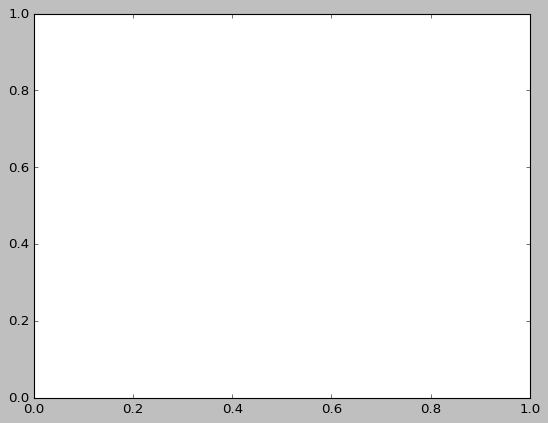

In [176]:
X = []; Y = []
for node, row in df_cir.iterrows():
    y = ASD_Bias.loc[node, "EFFECT"]
    X.append(x)
    Y.append(Y)
plt.scatter(X,Y)

#### ITR

In [143]:
ITRs_Cir = []
for v in g2.vs:
    itr = (v.indegree()+1) / (v.outdegree()+1 )
    ITRs_Cir.append(itr)
ITRs_Cir = np.log2(ITRs_Cir)

ITRs_Con = []
for v in g.vs:
    itr = (v.indegree()+1) / (v.outdegree()+1 )
    ITRs_Con.append(itr)
ITRs_Con = np.log2(ITRs_Con)

df_cir = pd.DataFrame(data={"STR": g2.vs["label"], "ITR":ITRs_Cir})
df_con = pd.DataFrame(data={"STR": g.vs["label"], "ITR":ITRs_Con})
df_cir = df_cir.set_index("STR")
df_con = df_con.set_index("STR")

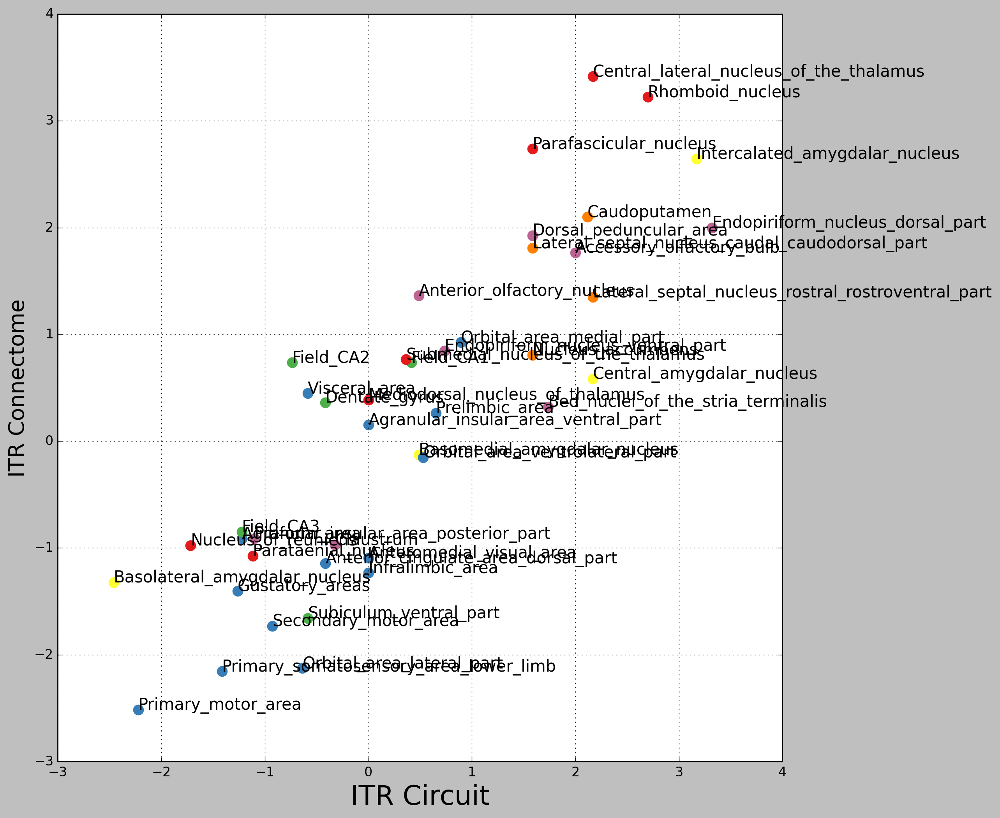

In [145]:
fig, ax = plt.subplots(dpi=200, figsize=(12,12))
color_dict = {"Isocortex":"#377eb8", "Thalamus": "#e41a1c", "Striatum":"#ff7f00", 
              "Olfactory_areas":"#BC6494", "Amygdalar": "#ffff33",
             "Hippocampus":"#4daf4a", 
              "Cortical_subplate":"#BC6494", "Pallidum": "#BC6494"}

for node, row in df_cir.iterrows():
    reg = str2reg[node]
    x = df_cir.loc[node, "ITR"]
    y = df_con.loc[node, "ITR"]
    #x = np.log2(x+1)
    #y = np.log2(y+1)
    ax.scatter(x, y, marker="o", color=color_dict[reg], s=80)
    ax.text(x, y, node, fontsize=15)
    
#lims = [np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
##        np.max([ax.get_xlim(), ax.get_ylim()]),]  # max of both axes]
#ax.plot(lims, lims, alpha=0.75, zorder=0, color="grey", ls="dashed")
#ax.set_xlim(lims)
#ax.set_ylim(lims)   

#ax.plot([0,2.6], [0,2.6], 'k-', alpha=0.75, zorder=0)
ax.set_xlabel("ITR Circuit", fontsize=25)
ax.set_ylabel("ITR Connectome", fontsize=20)
ax.grid(True)

#### Phenotype

In [243]:
ASD_Bias = pd.read_csv("dat/bias2/ASD.EW.pLI.z2.qval.csv", index_col="STR")
Circuit_STRs = ASD_Bias.index.values[:50]
HighIQ_Spec = pd.read_csv("dat/bias2/ASD.HIQ_spec.bias.csv", index_col="STR")
LowIQ_Spec = pd.read_csv("dat/bias2/ASD.LIQ_spec.bias.csv", index_col="STR")

str2reg = STR2Region()
IQ_Phenotype_dat = []
for STR in Circuit_STRs:
    Region = str2reg[STR]
    A_effect = HighIQ_Spec.loc[STR, "EFFECT"]
    B_effect = LowIQ_Spec.loc[STR, "EFFECT"]
    A_rank = HighIQ_Spec.loc[STR, "Rank"]
    B_rank = LowIQ_Spec.loc[STR, "Rank"]
    BiasDiff = B_effect - A_effect
    RankDiff = B_rank - A_rank
    IQ_Phenotype_dat.append([STR, Region, A_effect, B_effect, 
                             A_rank, B_rank, BiasDiff, RankDiff])
IQ_PhenotypeDF = pd.DataFrame(IQ_Phenotype_dat, columns=["STR", "REG", "HighIQ Bias", 
            "LowIQ Bias", "HighIQ Rank", "LowIQ Rank", "Bias Diff (low-high)", "Rank Diff"])
IQ_PhenotypeDF = IQ_PhenotypeDF.set_index("STR")

In [244]:
def hahahaha(STR, XXX):
    res = []
    for i in range(0, 10000):
        #print(i, len(XXX["HighIQ"]))
        df1 = XXX["HighIQ"][i]
        df2 = XXX["LowIQ"][i]
        effect_diff = df2.loc[STR, "EFFECT"] - df1.loc[STR, "EFFECT"]
        res.append(effect_diff)
    return np.array(res)
DataDF_dat = []
XXX = {"HighIQ":[], "LowIQ":[]}
for i in range(1, 10001):
    df1 = pd.read_csv("dat/IQ_permut/HighIQ_spec.bias.perm.{}.csv".format(i), index_col="STR")
    df2 = pd.read_csv("dat/IQ_permut/LowIQ_spec.bias.perm.{}.csv".format(i), index_col="STR")
    XXX["HighIQ"].append(df1)
    XXX["LowIQ"].append(df2)
for i, row in IQ_PhenotypeDF.iterrows():
    STR = i
    REG = row["REG"]
    Diff = row["Bias Diff (low-high)"]
    HighIQ = row["HighIQ Bias"]
    LowIQ = row["LowIQ Bias"]
    permut_diff = hahahaha(STR, XXX)
    #Z, P = GetPermutationP(permut_diff, Diff, gt=True)
    Z, P = GetPermutationP(np.abs(permut_diff), abs(Diff), gt=True)
    IQ_PhenotypeDF.loc[i, "Pvalue"] = P
    print("%s %.3f %.3f %.3f %.3e" % (STR, HighIQ, LowIQ, Diff, P))

Lateral_amygdalar_nucleus 0.139 0.655 0.516 4.000e-04
Orbital_area_lateral_part 0.307 0.513 0.207 8.909e-02
Prelimbic_area 0.112 0.646 0.534 9.999e-05
Dentate_gyrus 0.390 0.603 0.213 1.385e-01
Nucleus_accumbens 0.351 0.560 0.209 6.929e-02
Orbital_area_ventrolateral_part 0.137 0.489 0.352 3.500e-03
Anterior_pretectal_nucleus 0.642 0.436 -0.205 1.927e-01
Basomedial_amygdalar_nucleus 0.473 0.401 -0.072 4.840e-01
Lateral_posterior_nucleus_of_the_thalamus 0.398 0.569 0.171 1.853e-01
Infralimbic_area 0.077 0.587 0.511 9.999e-05
Intercalated_amygdalar_nucleus 0.593 0.368 -0.225 5.029e-02
Endopiriform_nucleus_dorsal_part 0.253 0.504 0.252 3.580e-02
Claustrum 0.142 0.551 0.409 5.000e-04
Nucleus_of_reuniens 0.189 0.535 0.346 7.999e-03
Anterior_olfactory_nucleus 0.493 0.423 -0.070 6.133e-01
Primary_somatosensory_area_lower_limb 0.124 0.462 0.338 5.099e-03
Dorsal_peduncular_area 0.059 0.535 0.476 9.999e-05
Field_CA3 0.235 0.465 0.229 6.719e-02
Subiculum_ventral_part 0.120 0.450 0.330 9.099e-03
Fie

In [245]:
CIR_REGIONS = ['Isocortex', 'Hippocampus', 
    'Cortical_subplate', 'Amygdalar', 'Striatum', 'Thalamus', 'Olfactory_areas']

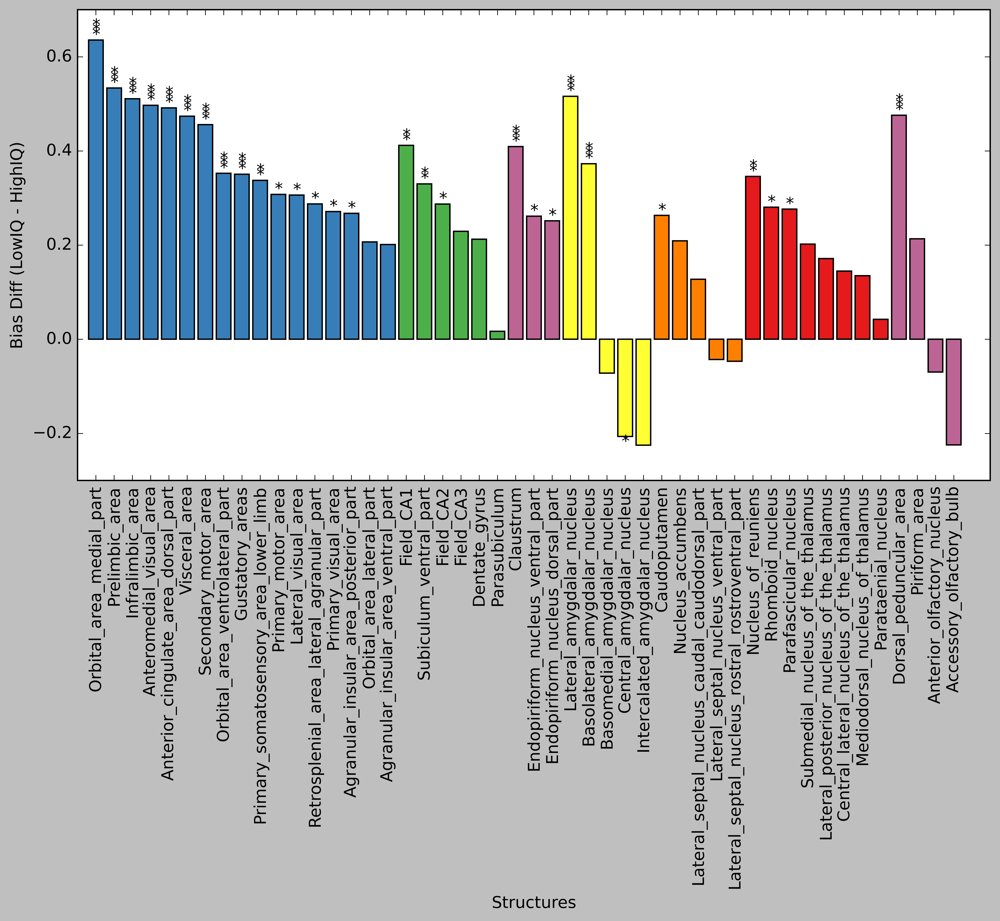

In [246]:
idx = 1
fig, ax = plt.subplots(dpi=720, figsize=(12,6))
STR_labels = []
for REG in CIR_REGIONS:
    #print(REG)
    xx = IQ_PhenotypeDF[IQ_PhenotypeDF["REG"]==REG]
    xx = xx.sort_values("Bias Diff (low-high)", ascending=False)
    for i, row in xx.iterrows():
        STR = i
        REG = row["REG"]
        Diff = row["Bias Diff (low-high)"]
        Pvalue = row["Pvalue"]
        #print(STR, REG, Pvalue)
        ax.bar(idx, Diff, color=color_dict[REG])
        STR_labels.append(STR)
        if Diff > 0:
            if Pvalue < 0.05:
                ax.text(idx-0.20, Diff+0.001, s="*", color="black")
            if Pvalue < 0.01:
                ax.text(idx-0.20, Diff+0.011, s="*", color="black")
            if Pvalue < 0.005:
                ax.text(idx-0.20, Diff+0.021, s="*", color="black")
        else:
            if Pvalue < 0.05:
                ax.text(idx-0.20, Diff-0.021, s="*", color="black")
            if Pvalue < 0.01:
                ax.text(idx-0.20, Diff-0.031, s="*", color="black")
            if Pvalue < 0.005:
                ax.text(idx-0.20, Diff-0.041, s="*", color="black")
        idx += 1
ax.set_ylabel("Bias Diff (LowIQ - HighIQ)")
ax.set_xlabel("Structures")
ax.set_ylim(-0.3, 0.7)
ax.set_xticks(range(1, idx))
ax.set_xticklabels(STR_labels, rotation=90)
plt.show()

# Supplementary Tables

#### ASD Bias & Qvalue & Other

In [4]:
ASD_Bias = pd.read_csv("../dat/Unionize_bias/Spark_Meta_EWS.Z2.bias.csv", index_col="STR")

In [6]:
# ASD Bias Qvalue
import statsmodels.stats as stats

def getBiasesBySTR(STR, dfs):
    biases = []
    for df in dfs:
        bias = df.loc[STR, "EFFECT"]
        biases.append(bias)
    biases = np.array(biases)
    return biases

ASD_Sim_dir = "../dat/Unionize_bias/SubSampleSib/"
#ASD_Sim_dir = "../dat/Unionize_bias/RandGene.61.W1/"

cont_dfs = []
for file in os.listdir(ASD_Sim_dir):
    if file.startswith("cont.genes"):
        continue
    df = pd.read_csv(ASD_Sim_dir+file, index_col="STR")
    cont_dfs.append(df)

for STR, row in ASD_Bias.iterrows():
    mat_bias = getBiasesBySTR(STR, cont_dfs)
    Z, P = GetPermutationP(mat_bias, row["EFFECT"])
    ASD_Bias.loc[STR, "Pvalue"] = P
    ASD_Bias.loc[STR, "Z_Match"] = Z
    
acc, qvalues = stats.multitest.fdrcorrection(ASD_Bias["Pvalue"].values, alpha=0.1,
                                                   method="i")
print(sum(acc))
ASD_Bias["qvalues"] = qvalues
ASD_Bias.to_csv("../dat/Unionize_bias/Spark_Meta_EWS.Z2.bias.subsib.FDR.csv")

32


In [7]:
acc, qvalues = stats.multitest.fdrcorrection(ASD_Bias["Pvalue"].values, alpha=0.05,
                                                   method="i")
print(sum(acc))

0


In [8]:
ASD_Bias.head(50)

,EFFECT,REGION,Rank,Pvalue,Z_Match,qvalues
STR,,,,,,
Nucleus_accumbens,0.504843,Striatum,1,0.000900,3.558431,0.058214
Orbital_area_lateral_part,0.502925,Isocortex,2,0.000500,3.492359,0.058214
Prelimbic_area,0.497309,Isocortex,3,0.001200,3.420127,0.058214
Primary_somatosensory_area_lower_limb,0.467266,Isocortex,4,0.002600,3.135280,0.058214
Orbital_area_ventrolateral_part,0.464161,Isocortex,5,0.002400,3.011598,0.058214
Parafascicular_nucleus,0.459904,Thalamus,6,0.012099,2.466564,0.088864
Lateral_amygdalar_nucleus,0.450113,Amygdalar,7,0.003300,3.059199,0.058214
Claustrum,0.446213,Cortical_subplate,8,0.004700,2.946763,0.060135
Endopiriform_nucleus_dorsal_part,0.435461,Cortical_subplate,9,0.002300,3.203480,0.058214


In [10]:
# Things to annotate: 
# 1. ASC 102 genes bias
# 2. Spark 159 Genes bias
# 3. Neuro Density Normed bias
# 4. Neuro/Glia Normed bias
# 5. Male Bias
# 6. Female Bias
# 7. 46 Circuit membership
# 8. 32 Circuit membership

ASD_ASC = pd.read_csv("../dat/Unionize_bias/ASD.ASC102.Z2.bias.csv", 
                                      index_col="STR")
ASD_159 = pd.read_csv("../dat/Unionize_bias/ASD.159.pLI.z2.csv", 
                                      index_col="STR")
ASD_Male = pd.read_csv("../dat/Unionize_bias/ASD.Male.ALL.bias.csv", 
                                      index_col="STR")
ASD_Female = pd.read_csv("../dat/Unionize_bias/ASD.Female.ALL.bias.csv", 
                                      index_col="STR")
ASD_Neuron_den_norm_bias = pd.read_csv("../dat/Unionize_bias/ASD.neuron.density.norm.bias.csv", 
                                      index_col="STR")
ASD_Glia_norm_bias = pd.read_csv("../dat/Unionize_bias/ASD.neuro2glia.norm.bias.csv", 
                                      index_col="STR")
ASD_CircuitsSet = pd.read_csv(
    "/home/jw3514/Work/ASD_Circuits/notebooks/ASD.SA.Circuits.Size46.csv",
    index_col="idx")
ASD_Circuits = ASD_CircuitsSet.loc[3, "STRs"].split(";")

In [16]:

ASD_32 = "Anterior_cingulate_area_dorsal_part,Anterior_olfactory_nucleus,Anterior_pretectal_nucleus,Anteromedial_visual_area,Bed_nuclei_of_the_stria_terminalis,Caudoputamen,Claustrum,Dentate_gyrus,Endopiriform_nucleus_dorsal_part,Field_CA2,Infralimbic_area,Lateral_amygdalar_nucleus,Lateral_posterior_nucleus_of_the_thalamus,Lateral_visual_area,Mediodorsal_nucleus_of_thalamus,Nucleus_accumbens,Nucleus_of_reuniens,Orbital_area_lateral_part,Orbital_area_ventrolateral_part,Parafascicular_nucleus,Parataenial_nucleus,Posterior_parietal_association_areas,Prelimbic_area,Primary_motor_area,Primary_somatosensory_area_lower_limb,Primary_somatosensory_area_trunk,Primary_visual_area,Retrosplenial_area_lateral_agranular_part,Rhomboid_nucleus,Secondary_motor_area,Subiculum_ventral_part,Submedial_nucleus_of_the_thalamus"
ASD_32 = ASD_32.split(",")

In [18]:
for STR, row in ASD_Bias.iterrows():
    ASD_Bias.loc[STR, "Bias.Male"] = ASD_Male.loc[STR, "EFFECT"]
    ASD_Bias.loc[STR, "Bias.Famale"] = ASD_Female.loc[STR, "EFFECT"]
    ASD_Bias.loc[STR, "Bias.ASC102"] = ASD_ASC.loc[STR, "EFFECT"]
    ASD_Bias.loc[STR, "Bias.Spark159"] = ASD_159.loc[STR, "EFFECT"]
    ASD_Bias.loc[STR, "Bias.Neuron_density_normalized"] = ASD_Neuron_den_norm_bias.loc[STR, "EFFECT"]
    ASD_Bias.loc[STR, "Bias.Neuron_glia_ratio_normalized"] = ASD_Glia_norm_bias.loc[STR, "EFFECT"]
    if STR in ASD_Circuits:
        ASD_Bias.loc[STR, "Circuits.46"] = 1
    else:
        ASD_Bias.loc[STR, "Circuits.46"] = 0
    if STR in ASD_32:
        ASD_Bias.loc[STR, "Circuits.32"] = 1
    else:
        ASD_Bias.loc[STR, "Circuits.32"] = 0

In [19]:
ASD_Bias.to_excel("../Manuscript/SupTabs/SupTab1.xlsx")

In [ ]:
# Annotate Circuits/Centrality/Degree Ratio
for STR, row in ASD_Bias.iterrows():
    if row["Rank"] <= 50:
        ASD_Bias.loc[STR, "Circuits Candidate"] = 1
    else:
        ASD_Bias.loc[STR, "Circuits Candidate"] = 0
    if STR in Circuit_Nodes_GN:
        ASD_Bias.loc[STR, "Circuits Girvan–Newman"] = 1
    else:
        ASD_Bias.loc[STR, "Circuits Girvan–Newman"] = 0
    if STR in Circuit_Nodes_SA:
        ASD_Bias.loc[STR, "Circuits SA"] = 1
    else:
        ASD_Bias.loc[STR, "Circuits SA"] = 0
    

In [182]:
ASD_Bias

,EFFECT,REGION,Rank,Pvalue,Z_Match,qvalues
STR,,,,,,
Lateral_amygdalar_nucleus,0.523800,Amygdalar,1,0.000999,3.894416,0.026598
Orbital_area_lateral_part,0.513619,Isocortex,2,0.000999,3.861686,0.026598
Prelimbic_area,0.504315,Isocortex,3,0.000999,3.782017,0.026598
Dentate_gyrus,0.470681,Hippocampus,4,0.005994,2.893220,0.039898
Nucleus_accumbens,0.470189,Striatum,5,0.000999,3.368753,0.026598
...,...,...,...,...,...,...
Superior_olivary_complex,-0.630736,Pons,209,1.000000,-4.967621,1.000000
Pontine_reticular_nucleus_caudal_part,-0.633581,Pons,210,1.000000,-4.432147,1.000000
Paragigantocellular_reticular_nucleus_lateral_part,-0.660294,Medulla,211,1.000000,-5.110667,1.000000


##### sibling

In [14]:
Sib_Sim_Dir = "dat/bias2/Sib_Sim/"
sib_sim_dfs = []
for file in os.listdir(Sib_Sim_Dir):
    if file.startswith("cont.bias"):
        df = pd.read_csv(Sib_Sim_Dir+file, index_col="STR")
        sib_sim_dfs.append(df)
        
Sib_LGD_Dmis_Bias_DF = pd.read_csv("dat/bias2/sib.bias.csv", index_col="STR")
for STR, row in Sib_LGD_Dmis_Bias_DF.iterrows():
    mat_bias = getBiasesBySTR(STR, sib_sim_dfs)
    Z, P = GetPermutationP(mat_bias, row["EFFECT"])
    Sib_LGD_Dmis_Bias_DF.loc[STR, "Pvalue"] = P
    Sib_LGD_Dmis_Bias_DF.loc[STR, "Z_Match"] = Z
    
acc, qvalues = stats.multitest.fdrcorrection(Sib_LGD_Dmis_Bias_DF["Pvalue"].values, 
                                             alpha=0.1, method="i")
print(sum(acc))
Sib_LGD_Dmis_Bias_DF["qvalues"] = qvalues

2


In [15]:
Sib_LGD_Dmis_Bias_DF

,EFFECT,REGION,Rank,Pvalue,Z_Match,qvalues
STR,,,,,,
Posterior_limiting_nucleus_of_the_thalamus,0.126315,Thalamus,1,0.000296,3.375507,0.063055
Anterior_pretectal_nucleus,0.124061,Midbrain,2,0.000888,3.060325,0.094583
Dentate_gyrus,0.100703,Hippocampus,3,0.022202,2.030594,0.371324
Lateral_dorsal_nucleus_of_thalamus,0.099005,Thalamus,4,0.005033,2.533211,0.357312
Medial_geniculate_complex_medial_part,0.091520,Thalamus,5,0.015394,2.155390,0.371324
...,...,...,...,...,...,...
Piriform_area,-0.090910,Olfactory_areas,209,0.994079,-2.455867,0.994967
Medial_amygdalar_nucleus,-0.093264,Amygdalar,210,0.994671,-2.460364,0.994967
Tuberal_nucleus,-0.101960,Hypothalamus,211,0.960924,-1.714960,0.994967


#### Negative bias

In [ ]:
400 / (7200) *

In [76]:
7200/160

45.0

In [77]:
400 / 45 * 100

888.8888888888889

In [24]:
3 * 32 + 4 * 21 + 36 + 8

224

In [25]:
(50 + 75) * 2

250